In [1]:
from astropy.io import fits
import os
from sklearn import preprocessing
import shutil
from astropy.timeseries import LombScargle
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from scipy import optimize
from scipy.interpolate import CubicSpline
from scipy.integrate import simps
from scipy.interpolate import UnivariateSpline
from scipy.ndimage import gaussian_filter
import scipy.signal as signal
from astropy.time import Time
import pandas as pd
from lmfit import Model
from PyAstronomy.pyasl import foldAt
from scipy.optimize import curve_fit
import matplotlib.colors as colors
import matplotlib.cbook as cbook
from scipy.ndimage.filters import uniform_filter
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)
from matplotlib.gridspec import GridSpec

In [2]:
def straightLine(xpoints,ypoints,inXpoints):
    gradient = (ypoints[1]-ypoints[0])/(xpoints[1]-xpoints[0])
    intercept = ypoints[0] - (gradient*xpoints[0])
    outYpoints = (inXpoints*gradient)+intercept
    return outYpoints
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

def area_est(xpoints, ypoints, start, finish):
    
    startIdx = find_nearest(xpoints, start)
    finishIdx = find_nearest(xpoints, finish)
    xpoints = xpoints[startIdx:finishIdx]
    ypoints = ypoints[startIdx:finishIdx]
    areaEst = np.trapz(ypoints, x=xpoints)
    #offset = np.abs(min(ypoints))
    #ypoints = ypoints + offset
    #dx = xpoints[2]-xpoints[1]
    #areaEst = 0
    #for i in range(len(ypoints)-1):
        #areaEst = areaEst + ((ypoints[i]+ypoints[i+1])*dx/2)
    return areaEst
xpoints=np.linspace(0,4200,4200)
def median_average(array, N):
    result = []
    for i in range(0, int(np.shape(array)[0]/N)+1):
        tmparray = array[i*N:(i*N+N)]
        tmparray = np.median(tmparray,axis=0)
        if i == 0:
            result = tmparray
            
        else:
            result = np.vstack([result, tmparray])
            
    return result
def foldMeth(timeArray, period):
    phases = []
    for el in timeArray:
        passed = int(el/period)
        leftover = el - (passed*period)
        phase = leftover/period
        phases.append(phase)
    return np.array(phases)

def f(x, c, q,A, B): 
    return c*x*x*x + q*x*x + A*x + B

def f2(x, d,c, q,A, B): 
    return d*x*x*x*x + c*x*x*x + q*x*x + A*x + B
def f3(x, c, q,A): 
    return c*x*x + q*x + A

def f5(x, c, q,A,b,d,z): 
    return c*x*x*x*x*x + q*x*x*x*x + A*x*x*x + b*x*x + d*x+z

def gaus(x,a,x0,sigma,c):
    return a*np.exp(-(x-x0)**2/(2*sigma**2))-c
def gausDouble(x,a,x0,sigma,c, a2,x02,sigma2):
    return (a*np.exp(-(x-x0)**2/(2*sigma**2)))+(a2*np.exp(-(x-x02)**2/(2*sigma2**2)))-c

def wavelToVelB(wavel):
    return 299792.458*(wavel-4861.363)/4861.363
def wavelToVelR(wavel):
    return 299792.458*(wavel-6562.801)/6562.801
def wavelToStdB(wavel):
    return (wavel/0.437)*27
def wavelToStdR(wavel):
    return (wavel/0.488)*22

In [3]:
fff = open("timeBM", "r")
timeBM = []
for x in fff:
    x = float(x)
    timeBM.append(x)
    
fff = open("timeRM", "r")
timeRM = []
for x in fff:
    x = float(x)
    timeRM.append(x)
    
fff = open("timeBJ", "r")
timeBJ = []
for x in fff:
    x = float(x)
    timeBJ.append(x)
    
fff = open("timeRJ", "r")
timeRJ = []
for x in fff:
    x = float(x)
    timeRJ.append(x)
    
BJXpoints = np.linspace(3625, 5460, 4200)
print(BJXpoints[665:3485])

RJXpoints = np.linspace(5525, 7575, 4200)
print(RJXpoints[800:3200])

countGlob = 1
holder_arrayBM = []

path = 'C:/Users/Admin/newMay19/'
consts = []
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayBM = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayBM = np.vstack((holder_arrayBM, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
countGlob = 1
holder_arrayBJ = []

path = 'C:/Users/Admin/newJul18/'
consts = []
with open(path+'BTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayBJ = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayBJ = np.vstack((holder_arrayBJ, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2
        
countGlob = 1
holder_arrayRJ = []

path = 'C:/Users/Admin/newJul18/'
consts = []
with open(path+'RTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
  
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayRJ = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayRJ = np.vstack((holder_arrayRJ, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2

countGlob = 1
holder_arrayRM = []

path = 'C:/Users/Admin/newMay19/'
consts = []
with open(path+'RTarOutDis') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        typeEx = hdul[0].data
        typeEx = typeEx[1]
        typeEx = typeEx.flatten()

        hdul.close()
        if countGlob == 1:
            
            holder_arrayRM = gaussian_filter(typeEx, sigma=1)
        else:
            
            holder_arrayRM = np.vstack((holder_arrayRM, gaussian_filter(typeEx, sigma=1)))
        countGlob = 2

[3915.61085973 3916.04786854 3916.48487735 ... 5146.66468207 5147.10169088
 5147.53869969]
[5915.56918314 5916.05739462 5916.5456061  ... 7085.81209812 7086.3003096
 7086.78852108]


In [6]:
#individual morph
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
xp1 = xpointss[0:35]
xp2 = xpointss[125:800]
xp3 = xpointss[1100:1180]
xp4 = xpointss[1330:1440]
xp5 = xpointss[1550:2400]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)


testMean = np.zeros(len(xpointss))
for i in range(113):
    flux = holder_arrayBJ[i]
    flux = flux[:4100]
    flux = flux[1500:3800]
    tmp1 = flux[0:35]
    tmp2 = flux[125:800]
    tmp3 = flux[1100:1180]
    tmp4 = flux[1330:1440]
    tmp5 = flux[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = flux/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    for count, el in enumerate(fluxNormed):
        if el > 1.2:
            fluxNormed[count] = np.median(fluxNormed[count-100:count+100])
            
    fluxNormed = fluxNormed * f(xpointss, popt[0], popt[1], popt[2], popt[3])
    tmp1 = fluxNormed[0:35]
    tmp2 = fluxNormed[125:800]
    tmp3 = fluxNormed[1100:1180]
    tmp4 = fluxNormed[1330:1440]
    tmp5 = fluxNormed[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = fluxNormed/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    testMean = testMean + fluxNormed
    #plt.plot(xpointss[800:1600], testMean[800:1600])
    #plt.plot(xpointss[800:1600], fluxNormed[800:1600], c='k')
    #plt.show()
    if i ==0:
        stack = fluxNormed[800:1600]
    else:
        stack = np.vstack((stack, fluxNormed[800:1600]))
testMean = testMean /113
stackBJ = stack
testMeanBJ = testMean
#above 1.2
#0.2-0.4 full

D:\conda\lib\site-packages\scipy\optimize\minpack.py:795: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


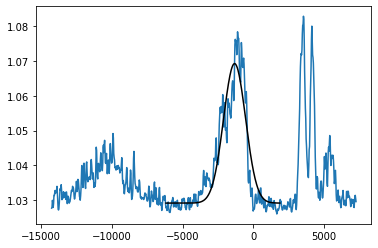

In [7]:
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
velocityBJ = velocity
colmean = np.clip(stackBJ, 1.025,1.15).mean(axis=0)
plt.plot(velocity,colmean)
JulBVel = velocity
JulBmean = colmean


popt,pcov = curve_fit(gausDouble,JulBVel[300:600],JulBmean[300:600],p0=[0.03,wavelToVelB(4825),wavelToStdB(3),0.05,wavelToVelB(4840),wavelToStdB(5),-1.03])
plt.plot(JulBVel[300:600],gausDouble(JulBVel[300:600],*popt),c='k')
plt.show()


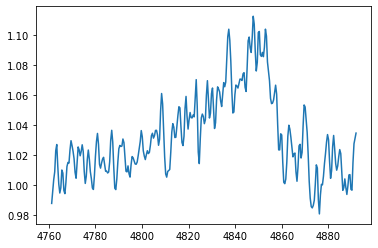

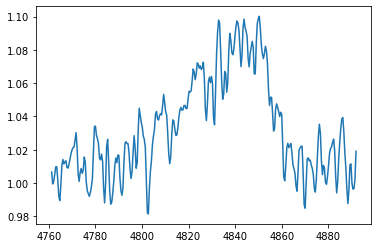

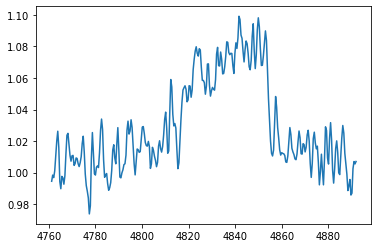

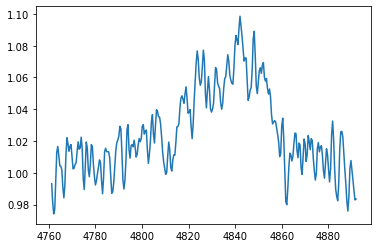

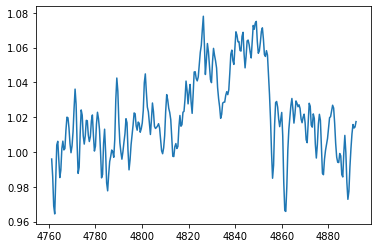

...

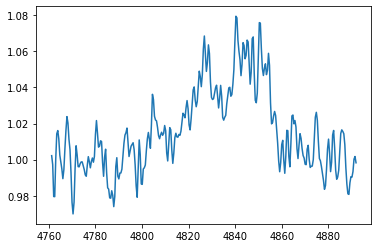

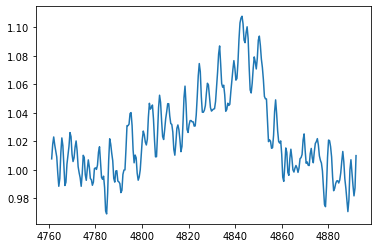

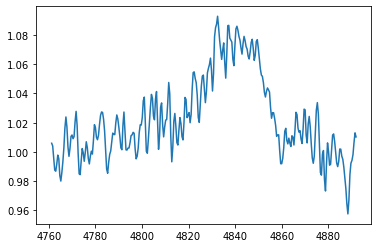

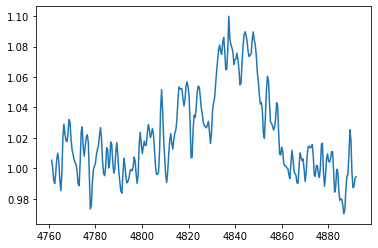

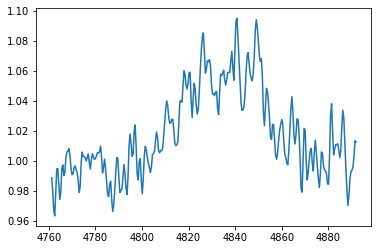

In [8]:
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
weights = []



BJGaussMEansM = []
BJGaussMEansMErr = []
miniCount = 0
timeBJ = np.array(timeBJ)
timeBJMean = np.nanmean(np.pad(timeBJ.astype(float), (0, 5 - timeBJ.size%5), mode='constant', constant_values=np.NaN).reshape(-1, 5), axis=1)    
timeBJMean  = timeBJMean[:-1]
fluxstack = np.zeros(300)
for i in range(113):
    thisflux = stackBJ[i]
    piComp = thisflux[300:600]
    weights.append(1/np.std(piComp[:50]))
    if miniCount == 4:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 5
        plt.plot(xpointss[1100:1400],fluxstack)
        popt,pcov = curve_fit(gausDouble,JulBVel[300:600],fluxstack,p0=[0.03,wavelToVelB(4825),wavelToStdB(2),-1.03,0.05,wavelToVelB(4840),wavelToStdB(5)],maxfev=10000)
        #plt.plot(JulBVel[300:600],gausDouble(JulBVel[300:600],*popt),c='k')
        plt.show()
        BJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErr.append(thisstd)
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
    else:
        fluxstack = fluxstack + piComp
        miniCount +=1


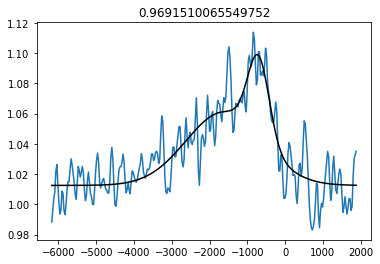

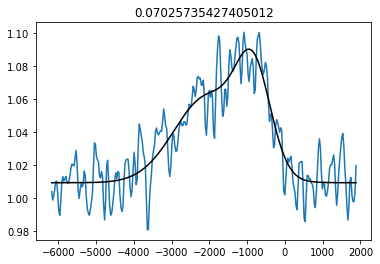

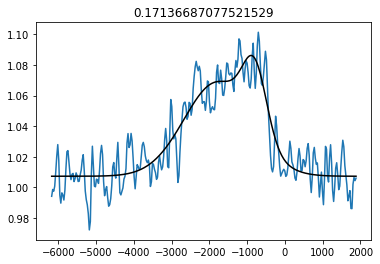

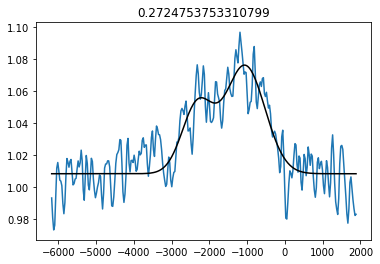

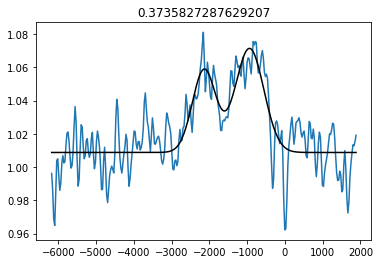

...

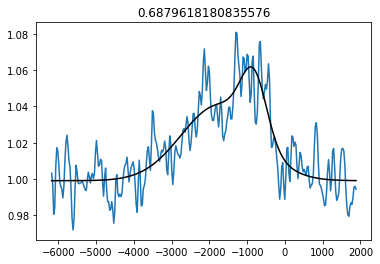

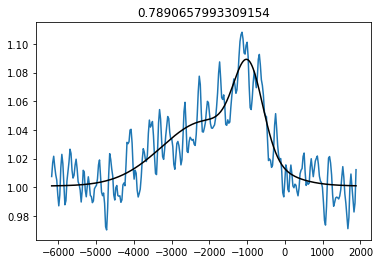

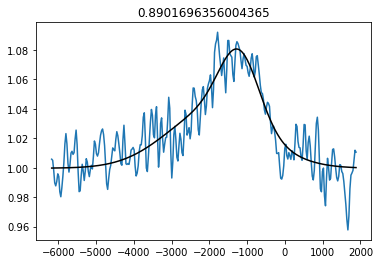

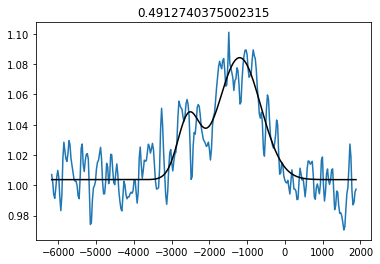

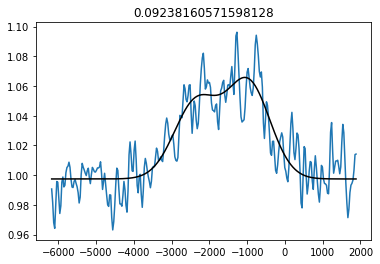

In [9]:
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
meanLeft = []
meanRight = []
stdLeft = []
stdRight = []
model = []
BJGaussMEansM = []
BJGaussMEansMErr = []
miniCount = 0
timeBJ = np.array(timeBJ)
timeBJMean = np.nanmean(np.pad(timeBJ.astype(float), (0, 5 - timeBJ.size%5), mode='constant', constant_values=np.NaN).reshape(-1, 5), axis=1)    
timeBJMean  = timeBJMean[:-1]
fluxstack = []
phases = foldMeth(timeBM,0.08029870250017346)
for i in range(113):
    thisflux = stackBJ[i]
    piComp = thisflux[300:600]
    washere=False
    if miniCount == 1 or miniCount == 2 or miniCount == 3:
        fluxstack = np.vstack((fluxstack,piComp))
        miniCount +=1
        washere = True
    if miniCount == 0:
        fluxstack = piComp
        miniCount +=1
    if miniCount == 4 and washere==False:
        fluxstack = np.vstack((fluxstack,piComp))
        fluxstack = np.average(fluxstack, axis=0, weights=weights[i-4:i+1])
        plt.title(np.mean(phases[i-4:i]))
        plt.plot(JulBVel[300:600],fluxstack)
        popt,pcov = curve_fit(gausDouble,JulBVel[300:600],fluxstack,p0=[0.06,wavelToVelB(4825),wavelToStdB(5),-1.03,0.05,wavelToVelB(4840),wavelToStdB(5)],bounds=([0.04,wavelToVelB(4820),wavelToStdB(1),-1.1,0.01,wavelToVelB(4840),wavelToStdB(1)],[0.1,wavelToVelB(4840),wavelToStdB(20),-0.98,0.1,wavelToVelB(4850),wavelToStdB(30)]),maxfev=10000)
        meanLeft.append(popt[1])
        meanRight.append(popt[5])
        stdLeft.append(popt[2])
        stdRight.append(popt[6])
        plt.plot(JulBVel[300:600],gausDouble(JulBVel[300:600],*popt),c='k')
        if i == 4:
            model = gausDouble(JulBVel[300:600],*popt)
        else:
            model = np.vstack((model,gausDouble(JulBVel[300:600],*popt)))
        plt.show()
        BJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErr.append(thisstd)
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
    


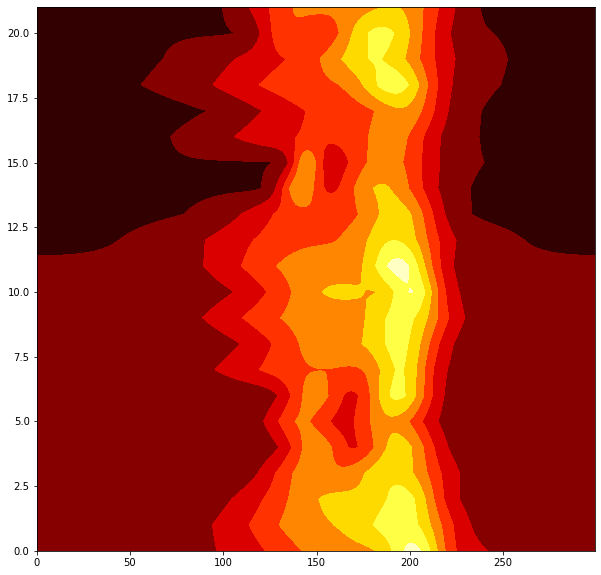

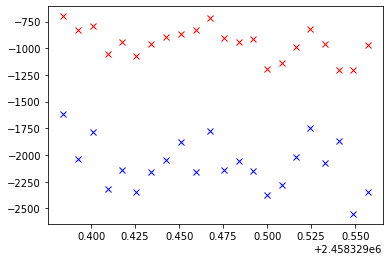

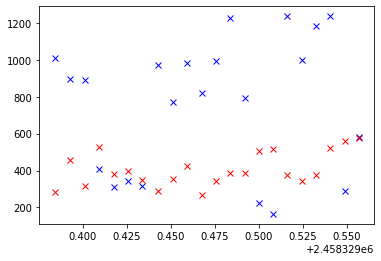

In [8]:
plt.figure(figsize=(10,10))
plt.contourf(model, cmap='hot')
plt.show()
plt.plot(timeBJMean, meanLeft, 'bx')
plt.plot(timeBJMean, meanRight, 'rx')
plt.show()
plt.plot(timeBJMean, stdLeft, 'bx')
plt.plot(timeBJMean, stdRight, 'rx')

In [10]:
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
meanLeft = []
meanRight = []
stdLeft = []
stdRight = []
model = []
BJGaussMEansM = []
BJGaussMEansMErr = []
miniCount = 0
timeBJ = np.array(timeBJ)
timeBJMean = np.nanmean(np.pad(timeBJ.astype(float), (0, 5 - timeBJ.size%5), mode='constant', constant_values=np.NaN).reshape(-1, 5), axis=1)    
timeBJMean  = timeBJMean[:-1]
fluxstack = []

for i in range(113):
    thisflux = stackBJ[i]
    piComp = thisflux[300:600]
    fluxstack = piComp
    popt,pcov = curve_fit(gausDouble,JulBVel[300:600],fluxstack,p0=[0.06,wavelToVelB(4825),wavelToStdB(5),-1.03,0.05,wavelToVelB(4840),wavelToStdB(5)],bounds=([0.04,wavelToVelB(4820),wavelToStdB(1),-1.1,0.01,wavelToVelB(4840),wavelToStdB(1)],[0.1,wavelToVelB(4840),wavelToStdB(20),-0.98,0.1,wavelToVelB(4850),wavelToStdB(30)]),maxfev=10000)
    meanLeft.append(popt[1])
    meanRight.append(popt[5])
    stdLeft.append(popt[2])
    stdRight.append(popt[6])
    if i == 0:
        model = gausDouble(JulBVel[300:600],*popt)
    else:
        model = np.vstack((model,gausDouble(JulBVel[300:600],*popt)))
    


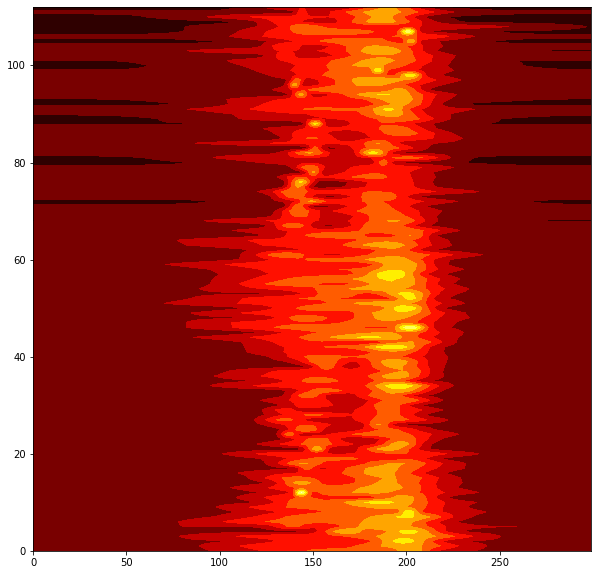

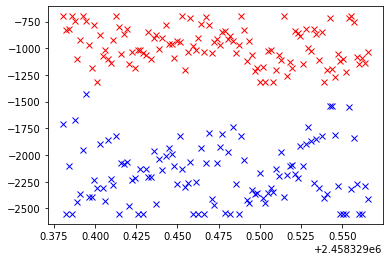

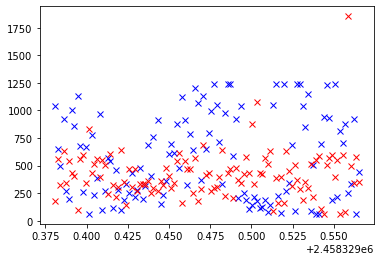

In [10]:
plt.figure(figsize=(10,10))
plt.contourf(model, cmap='hot')
plt.show()
plt.plot(timeBJ, meanLeft, 'bx')
plt.plot(timeBJ, meanRight, 'rx')
plt.show()
plt.plot(timeBJ, stdLeft, 'bx')
plt.plot(timeBJ, stdRight, 'rx')

In [11]:
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
meanLeft = []
meanRight = []
stdLeft = []
stdRight = []
model = []
BJGaussMEansM = []
BJGaussMEansMErr = []
miniCount = 0
timeBM = np.array(timeBM)
timeBMMean = np.nanmean(np.pad(timeBM.astype(float), (0, 5 - timeBM.size%5), mode='constant', constant_values=np.NaN).reshape(-1, 5), axis=1)    
timeBMMean  = timeBMMean[:-1]
fluxstack = []
phases = foldMeth(timeBM,0.08029870250017346)
for i in range(120):
    thisflux = stackBM[i]
    piComp = thisflux[300:600]
    washere=False
    if miniCount == 1 or miniCount == 2 or miniCount == 3:
        fluxstack = np.vstack((fluxstack,piComp))
        miniCount +=1
        washere = True
    if miniCount == 0:
        fluxstack = piComp
        miniCount +=1
    if miniCount == 4 and washere==False:
        fluxstack = np.vstack((fluxstack,piComp))
        fluxstack = np.average(fluxstack, axis=0)
        plt.plot(JulBVel[300:600],fluxstack)
        plt.title(np.mean(phases[i-4:i]))
        popt,pcov = curve_fit(gausDouble,JulBVel[300:600],fluxstack,p0=[0.06,wavelToVelB(4825),wavelToStdB(5),-1.03,0.05,wavelToVelB(4840),wavelToStdB(5)],bounds=([0.04,wavelToVelB(4820),wavelToStdB(1),-1.1,0.01,wavelToVelB(4840),wavelToStdB(1)],[0.1,wavelToVelB(4840),wavelToStdB(20),-0.98,0.1,wavelToVelB(4850),wavelToStdB(30)]),maxfev=10000)
        plt.plot(JulBVel[300:600],gausDouble(JulBVel[300:600],*popt),c='k')
        if i == 4:
            model = gausDouble(JulBVel[300:600],*popt)
        else:
            model = np.vstack((model,gausDouble(JulBVel[300:600],*popt)))
        plt.show()
        BJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErr.append(thisstd)
        miniCount = 0
        fluxstack = np.zeros(len(piComp))


D:\conda\lib\site-packages\ipykernel_launcher.py:14: RuntimeWarning: Mean of empty slice
  


NameError: name 'stackBM' is not defined

TypeError: Input must be a 2D array.

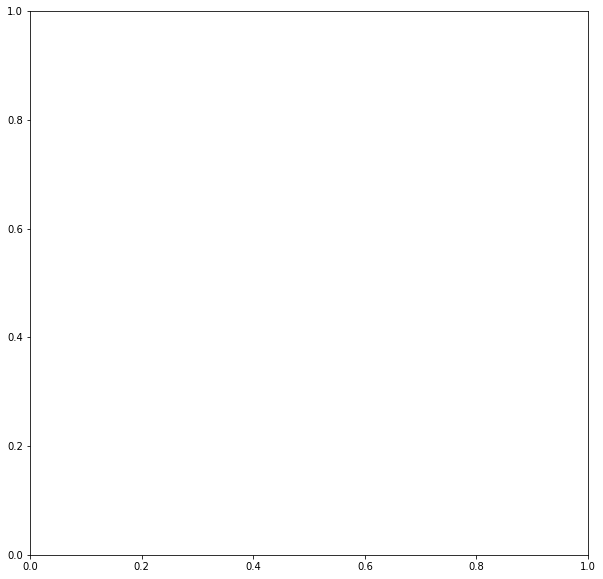

In [12]:
plt.figure(figsize=(10,10))
plt.contourf(model, cmap='hot')
plt.show()
plt.plot(timeBM, meanLeft, 'bx')
plt.plot(timeBM, meanRight, 'rx')
plt.show()
plt.plot(timeBM, stdLeft, 'bx')
plt.plot(timeBM, stdRight, 'rx')

D:\conda\lib\site-packages\ipykernel_launcher.py:78: RuntimeWarning: invalid value encountered in sqrt
D:\conda\lib\site-packages\scipy\optimize\minpack.py:795: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


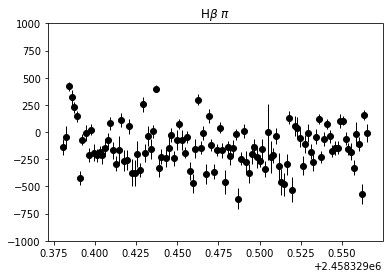

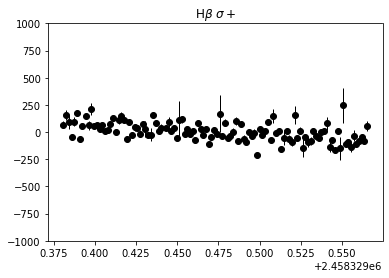

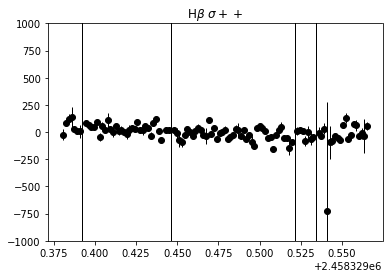

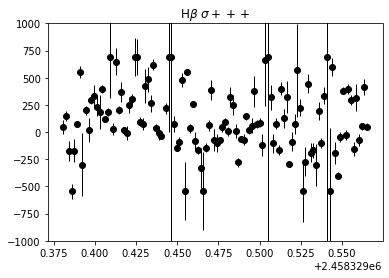

(-1000, 1000)

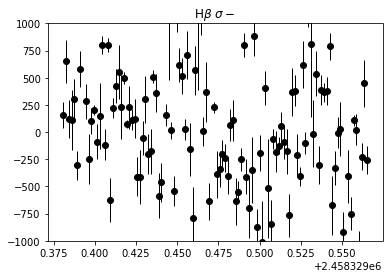

In [12]:
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
popt,pcov = curve_fit(gaus,JulBVel[300:600],JulBmean[300:600],p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
BJPiMean = popt[1]
BJPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[600:675],JulBmean[600:675],p0=[1,wavelToVelB(4920),wavelToStdB(5),1.03])
BJSPMean = popt[1]
BJSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[675:775],JulBmean[675:775],p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03])
BJSPPMean = popt[1]
BJSPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[700:],JulBmean[700:],p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
BJSPPPMean = popt[1]
BJSPPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[:300],JulBmean[:300],p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03])
BJSMMean = popt[1]
BJSMErr = np.sqrt(np.diag(pcov))[1]

BJGaussMEansM = []
BJGaussMEansMErr = []
BJGaussMEansMSP = []
BJGaussMEansMErrSP = []
BJGaussMEansMSPP = []
BJGaussMEansMErrSPP = []
BJGaussMEansMSPPP = []
BJGaussMEansMErrSPPP = []
BJGaussMEansMSM = []
BJGaussMEansMErrSM = []
miniCount = 0
timeBJ = np.array(timeBJ)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(75)
fluxstackSPP = np.zeros(100)
fluxstackSPPP = np.zeros(100)
fluxstackSM = np.zeros(300)
for i in range(113):
    thisflux = stackBJ[i]
    piComp = thisflux[300:600]
    SPComp = thisflux[600:675]
    SPPComp = thisflux[675:775]
    SPPPComp = thisflux[700:]
    SMComp = thisflux[:300]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1100:1400]),fluxstack,p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
        BJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1400:1475]),fluxstackSP,p0=[1,wavelToVelB(4920),wavelToStdB(5),1.03])
        BJGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSP.append(thisstd)
        
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPP = fluxstackSPP / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1475:1575]),fluxstackSPP,p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03], maxfev=10000)
        BJGaussMEansMSPP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSPP.append(thisstd)
        
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSPPP = fluxstackSPPP / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1500:1600]),fluxstackSPPP,p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
        BJGaussMEansMSPPP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSPPP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[800:1100]),fluxstackSM,p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03])
        BJGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSM.append(thisstd)
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(75)
        fluxstackSPP = np.zeros(100)
        fluxstackSPPP = np.zeros(100)
        fluxstackSM = np.zeros(300)
    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1
plt.title(r"H$\beta$ $\pi$")
plt.errorbar(timeBJ,BJGaussMEansM-BJPiMean,yerr=BJGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '') 
plt.ylim(-1000,1000)
plt.show()
plt.title(r"H$\beta$ $\sigma+$")
plt.errorbar(timeBJ,BJGaussMEansMSP-BJSPMean,yerr=BJGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.ylim(-1000,1000)
plt.show()
plt.title(r"H$\beta$ $\sigma++$")
plt.errorbar(timeBJ,BJGaussMEansMSPP-BJSPPMean,yerr=BJGaussMEansMErrSPP,c='k', lw=1, marker='o',ecolor='k', ls = '' )
plt.ylim(-1000,1000)
plt.show()
plt.title(r"H$\beta$ $\sigma+++$")
plt.errorbar(timeBJ,BJGaussMEansMSPPP-BJSPPPMean,yerr=BJGaussMEansMErrSPPP,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.ylim(-1000,1000)
plt.show()
plt.title(r"H$\beta$ $\sigma-$")
plt.errorbar(timeBJ,BJGaussMEansMSM-BJSMMean,yerr=BJGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.ylim(-1000,1000)

In [13]:
BJPiV = BJGaussMEansM-BJPiMean
BJPiVe = BJGaussMEansMErr
np.save('BJPiV.npy', BJPiV)
np.save('BJPiVe.npy', BJPiVe)


BJSPV = BJGaussMEansMSP-BJSPMean
BJSPVe = BJGaussMEansMErrSP
np.save('BJSPV.npy', BJSPV)
np.save('BJSPVe.npy', BJSPVe)


BJSPPV = BJGaussMEansMSPP-BJSPPMean
BJSPPVe = BJGaussMEansMErrSPP
np.save('BJSPPV.npy', BJSPPV)
np.save('BJSPPVe.npy', BJSPPVe)



BJSPPPV = BJGaussMEansMSPPP-BJSPPPMean
BJSPPPVe = BJGaussMEansMErrSPPP
np.save('BJSPPPV.npy', BJSPPPV)
np.save('BJSPPPVe.npy', BJSPPPVe)


BJSMV = BJGaussMEansMSM-BJSMMean
BJSMVe = BJGaussMEansMErrSM
np.save('BJSMV.npy', BJSMV)
np.save('BJSMVe.npy', BJSMVe)

Text(5200, 1.05, 'H$\\beta$ $\\sigma+++$')

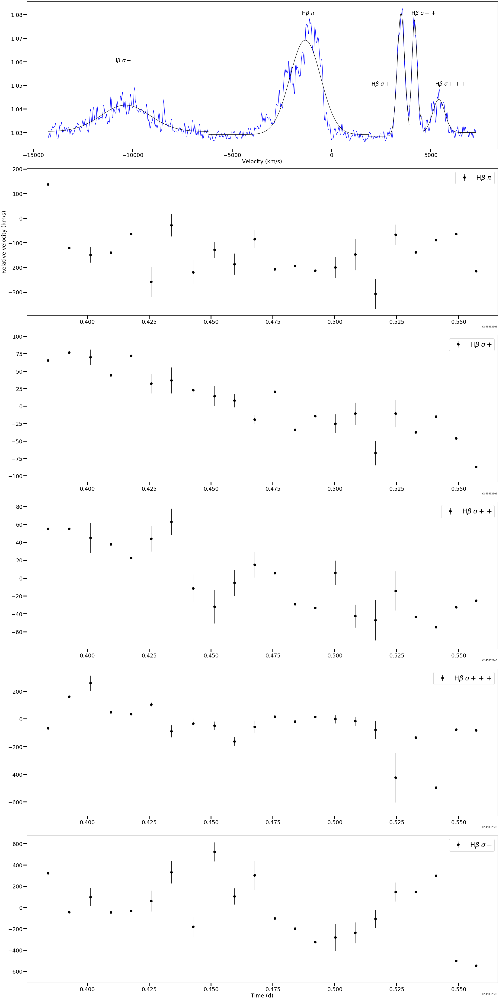

In [14]:
fig = plt.figure(tight_layout=True, figsize=(30,60))
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363

gs = GridSpec(6, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])

ax1.plot(JulBVel, JulBmean, c='b')
popt,pcov = curve_fit(gaus,JulBVel[300:600],JulBmean[300:600],p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
ax1.plot(JulBVel[300:600],gaus(JulBVel[300:600],*popt),c='k')
BJPiMean = popt[1]
BJPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[600:675],JulBmean[600:675],p0=[1,wavelToVelB(4920),wavelToStdB(5),1.03])
ax1.plot(JulBVel[600:675],gaus(JulBVel[600:675],*popt),c='k')

BJSPMean = popt[1]
BJSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[675:775],JulBmean[675:775],p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03])
ax1.plot(JulBVel[675:700],gaus(JulBVel[675:700],*popt),c='k')

BJSPPMean = popt[1]
BJSPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[700:],JulBmean[700:],p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
ax1.plot(JulBVel[700:],gaus(JulBVel[700:],*popt),c='k')

BJSPPPMean = popt[1]
BJSPPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulBVel[:300],JulBmean[:300],p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03])
ax1.plot(JulBVel[:300],gaus(JulBVel[:300],*popt),c='k')

BJSMMean = popt[1]
BJSMErr = np.sqrt(np.diag(pcov))[1]



BJGaussMEansM = []
BJGaussMEansMErr = []
BJGaussMEansMSP = []
BJGaussMEansMErrSP = []
BJGaussMEansMSPP = []
BJGaussMEansMErrSPP = []
BJGaussMEansMSPPP = []
BJGaussMEansMErrSPPP = []
BJGaussMEansMSM = []
BJGaussMEansMErrSM = []
miniCount = 0
timeBJ = np.array(timeBJ)
timeBJMean = np.nanmean(np.pad(timeBJ.astype(float), (0, 5 - timeBJ.size%5), mode='constant', constant_values=np.NaN).reshape(-1, 5), axis=1)    
timeBJMean  = timeBJMean[:-1]
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(75)
fluxstackSPP = np.zeros(100)
fluxstackSPPP = np.zeros(100)
fluxstackSM = np.zeros(300)
for i in range(113):
    thisflux = stackBJ[i]
    piComp = thisflux[300:600]
    SPComp = thisflux[600:675]
    SPPComp = thisflux[675:775]
    SPPPComp = thisflux[700:]
    SMComp = thisflux[:300]
    if miniCount == 4:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 5
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1100:1400]),fluxstack,p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
        BJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / 5
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1400:1475]),fluxstackSP,p0=[1,wavelToVelB(4920),wavelToStdB(5),1.03])
        BJGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSP.append(thisstd)
        
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPP = fluxstackSPP / 5
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1475:1575]),fluxstackSPP,p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03])
        BJGaussMEansMSPP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSPP.append(thisstd)
        
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSPPP = fluxstackSPPP / 5
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1500:1600]),fluxstackSPPP,p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
        BJGaussMEansMSPPP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSPPP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / 5
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[800:1100]),fluxstackSM,p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03])
        BJGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErrSM.append(thisstd)
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(75)
        fluxstackSPP = np.zeros(100)
        fluxstackSPPP = np.zeros(100)
        fluxstackSM = np.zeros(300)
    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1

ax2 = fig.add_subplot(gs[1, 0])
ax2.errorbar(timeBJMean,BJGaussMEansM-BJPiMean,yerr=BJGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '',ms=10 ,label=r"H$\beta$ $\pi$")
ax3 = fig.add_subplot(gs[2, 0])
ax3.errorbar(timeBJMean,BJGaussMEansMSP-BJSPMean,yerr=BJGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k',ms=10, ls = '' ,label = r"H$\beta$ $\sigma+$")
ax4 = fig.add_subplot(gs[3, 0])
ax4.errorbar(timeBJMean,BJGaussMEansMSPP-BJSPPMean,yerr=BJGaussMEansMErrSPP,c='k', lw=1, marker='o',ecolor='k',ms=10, ls = '',label=r"H$\beta$ $\sigma++$" )
ax5 = fig.add_subplot(gs[4, 0])
ax5.errorbar(timeBJMean,BJGaussMEansMSPPP-BJSPPPMean,yerr=BJGaussMEansMErrSPPP,c='k', lw=1, marker='o',ecolor='k',ms=10, ls = '',label=r"H$\beta$ $\sigma+++$")
ax6 = fig.add_subplot(gs[5, 0])
ax6.errorbar(timeBJMean,BJGaussMEansMSM-BJSMMean,yerr=BJGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '',ms=10 ,label=r"H$\beta$ $\sigma-$")





ax6.set_xlabel('Time (d)', fontsize=23)
ax1.set_xlabel('Velocity (km/s)', fontsize=23)
ax2.set_ylabel('Relative velocity (km/s)', fontsize=23)

ax1.tick_params(labelsize=23)
ax2.tick_params(labelsize=23)
ax3.tick_params(labelsize=23)
ax4.tick_params(labelsize=23)
ax5.tick_params(labelsize=23)
ax6.tick_params(labelsize=23)
ax2.legend(fontsize=28)
ax3.legend(fontsize=28)
ax4.legend(fontsize=28)
ax5.legend(fontsize=28)
ax6.legend(fontsize=28)
ax1.tick_params(which='major', length=14)
ax2.tick_params(which='major', length=14)
ax3.tick_params(which='major', length=14)
ax4.tick_params(which='major', length=14)
ax5.tick_params(which='major', length=14)
ax6.tick_params(which='major', length=14)
ax1.tick_params(which='both', width=4)
ax2.tick_params(which='both', width=4)
ax3.tick_params(which='both', width=4)
ax5.tick_params(which='both', width=4)
ax4.tick_params(which='both', width=4)
ax6.tick_params(which='both', width=4)
ax1.annotate(r"H$\beta$ $\sigma-$", xy=(-11000, 1.06),fontsize=23)
ax1.annotate(r"H$\beta$ $\pi$", xy=(-1500, 1.08),fontsize=23)
ax1.annotate(r"H$\beta$ $\sigma+$", xy=(2000, 1.05),fontsize=23)
ax1.annotate(r"H$\beta$ $\sigma++$", xy=(4000, 1.08),fontsize=23)
ax1.annotate(r"H$\beta$ $\sigma+++$", xy=(5200, 1.05),fontsize=23)
#plt.savefig('HBeta2018GaussV.pdf')

In [15]:
#individual morph
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
xp1 = xpointss[0:35]
xp2 = xpointss[125:800]
xp3 = xpointss[1100:1180]
xp4 = xpointss[1330:1440]
xp5 = xpointss[1550:2400]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
testMean = np.zeros(len(xpointss))

for i in range(120):
    flux = holder_arrayBM[i]
    flux = flux[:4100]
    flux = flux[1500:3800]
    tmp1 = flux[0:35]
    tmp2 = flux[125:800]
    tmp3 = flux[1100:1180]
    tmp4 = flux[1330:1440]
    
    
    tmp5 = flux[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = flux/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    for count, el in enumerate(fluxNormed):
        if el > 1.2:
            fluxNormed[count] = np.median(fluxNormed[count-25:count+100])
            
    fluxNormed = fluxNormed * f(xpointss, popt[0], popt[1], popt[2], popt[3])
    tmp1 = fluxNormed[0:35]
    tmp2 = fluxNormed[125:800]
    tmp3 = fluxNormed[1100:1180]
    tmp4 = fluxNormed[1330:1440]
    tmp5 = fluxNormed[1550:2400]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f, xpF, emptiedflux)
    fluxNormed = fluxNormed/f(xpointss, popt[0], popt[1], popt[2], popt[3])
    testMean = testMean + fluxNormed
    if i ==0:
        stack = fluxNormed[800:1600]
    else:
        stack = np.vstack((stack, fluxNormed[800:1600]))
testMean = testMean /120 
stackBM = stack
testMeanBM = testMean
#above 1.2
#0.2-0.4 full

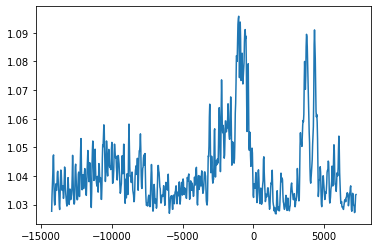

In [16]:
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
velocityBM = velocity
colmean = np.clip(stackBM, 1.025,1.15).mean(axis=0)
plt.plot(velocity,colmean)
MayBVel = velocity
MayBmean = colmean

D:\conda\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShellApp.init_path()


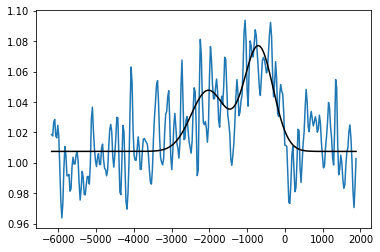

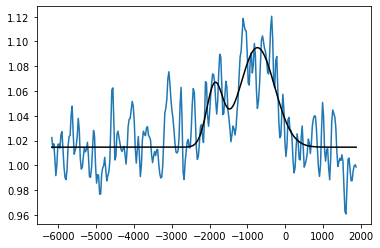

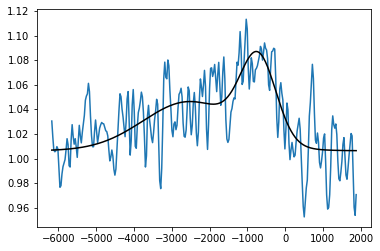

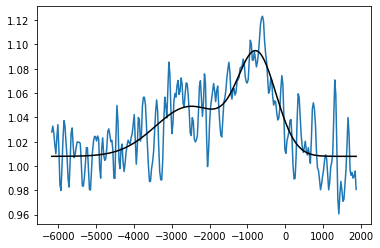

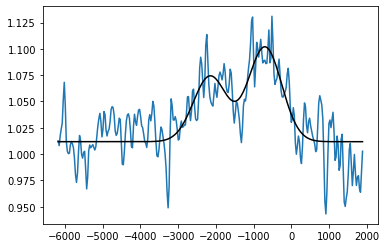

...

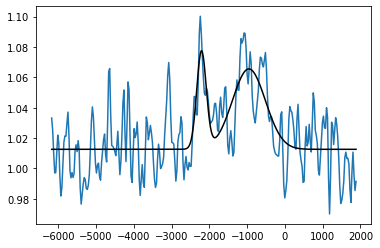

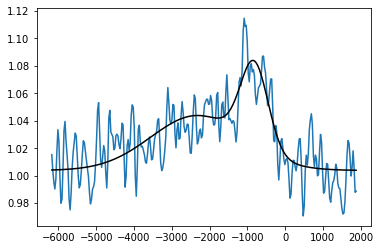

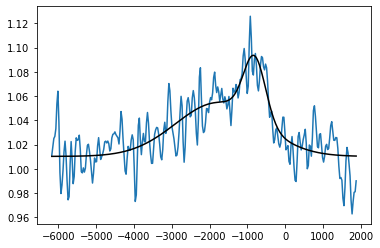

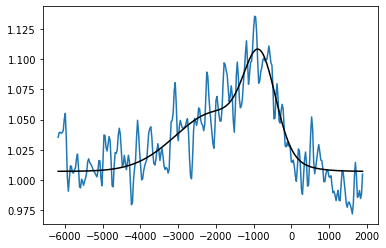

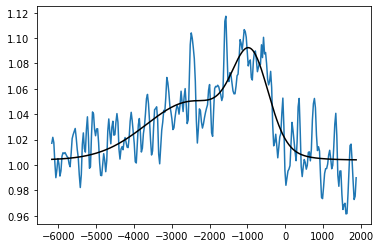

In [17]:
BJXpoints = np.linspace(3625, 5460, 4200)
BJXpoints = BJXpoints[:4100]
xpointss = BJXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363

model = []
BJGaussMEansM = []
BJGaussMEansMErr = []
miniCount = 0
timeBM = np.array(timeBM)
timeBMMean = np.nanmean(np.pad(timeBM.astype(float), (0, 5 - timeBM.size%5), mode='constant', constant_values=np.NaN).reshape(-1, 5), axis=1)    
timeBMMean  = timeBMMean[:-1]
fluxstack = []

for i in range(120):
    thisflux = stackBM[i]
    piComp = thisflux[300:600]
    washere=False
    if miniCount == 1 or miniCount == 2 or miniCount == 3:
        fluxstack = np.vstack((fluxstack,piComp))
        miniCount +=1
        washere = True
    if miniCount == 0:
        fluxstack = piComp
        miniCount +=1
    if miniCount == 4 and washere==False:
        fluxstack = np.vstack((fluxstack,piComp))
        fluxstack = np.average(fluxstack, axis=0)
        plt.plot(JulBVel[300:600],fluxstack)
        popt,pcov = curve_fit(gausDouble,JulBVel[300:600],fluxstack,p0=[0.06,wavelToVelB(4825),wavelToStdB(5),-1.03,0.05,wavelToVelB(4840),wavelToStdB(5)],bounds=([0.04,wavelToVelB(4820),wavelToStdB(1),-1.1,0.01,wavelToVelB(4840),wavelToStdB(1)],[0.1,wavelToVelB(4840),wavelToStdB(20),-0.98,0.1,wavelToVelB(4850),wavelToStdB(30)]),maxfev=10000)
        plt.plot(JulBVel[300:600],gausDouble(JulBVel[300:600],*popt),c='k')
        if i == 4:
            model = gausDouble(JulBVel[300:600],*popt)
        else:
            model = np.vstack((model,gausDouble(JulBVel[300:600],*popt)))
        plt.show()
        BJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BJGaussMEansMErr.append(thisstd)
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
    


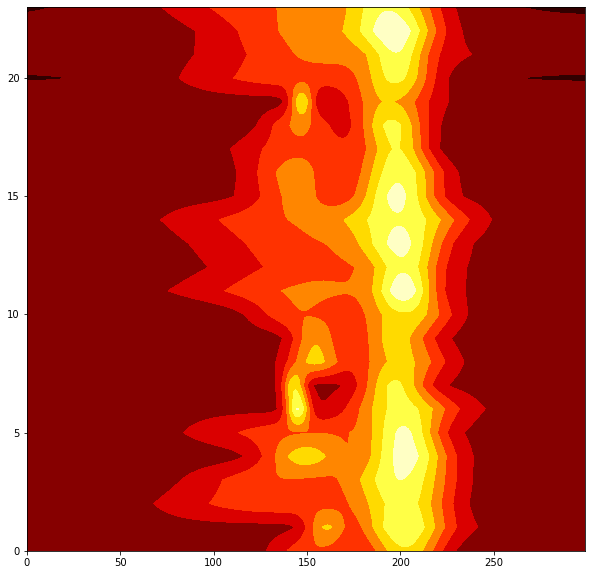

In [72]:
plt.figure(figsize=(10,10))
plt.contourf(model, cmap='hot')


D:\conda\lib\site-packages\scipy\optimize\minpack.py:795: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


pass
pass
pass


D:\conda\lib\site-packages\ipykernel_launcher.py:67: RuntimeWarning: invalid value encountered in sqrt
D:\conda\lib\site-packages\ipykernel_launcher.py:58: RuntimeWarning: invalid value encountered in sqrt
D:\conda\lib\site-packages\ipykernel_launcher.py:83: RuntimeWarning: invalid value encountered in sqrt


pass


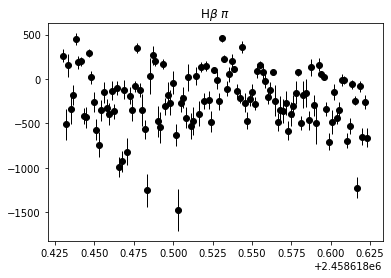

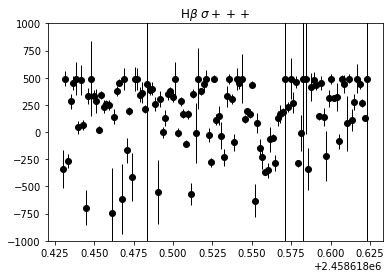

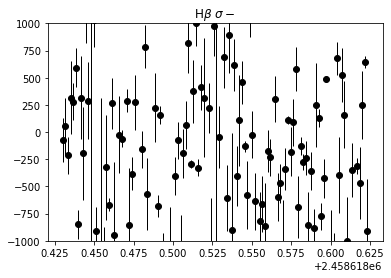

In [18]:
BMXpoints = np.linspace(3625, 5460, 4200)
BMXpoints = BMXpoints[:4100]
xpointss = BMXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363
popt,pcov = curve_fit(gaus,MayBVel[300:600],MayBmean[300:600],p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
BMPiMean = popt[1]
BMPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[600:680],MayBmean[600:680],p0=[1,wavelToVelB(4920),wavelToStdB(5),-1])
BMSPMean = popt[1]
BMSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[675:775],MayBmean[675:775],p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03])
BMSPPMean = popt[1]
BMSPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[700:],MayBmean[700:],p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
BMSPPPMean = popt[1]
BMSPPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[:300],MayBmean[:300],p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03],bounds=([0,wavelToVelB(4640),wavelToStdB(20),-1.1],[0.1,wavelToVelB(4720),wavelToStdB(40),-0.95]))
BMSMMean = popt[1]
BMSMErr = np.sqrt(np.diag(pcov))[1]

BMGaussMEansM = []
BMGaussMEansMErr = []
BMGaussMEansMSP = []
BMGaussMEansMErrSP = []
BMGaussMEansMSPP = []
BMGaussMEansMErrSPP = []
BMGaussMEansMSPPP = []
BMGaussMEansMErrSPPP = []
BMGaussMEansMSM = []
BMGaussMEansMErrSM = []
miniCount = 0
timeBM = np.array(timeBM)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(80)
fluxstackSPP = np.zeros(100)
fluxstackSPPP = np.zeros(100)
fluxstackSM = np.zeros(300)
for i in range(120):
    thisflux = stackBM[i]
    piComp = thisflux[300:600]
    SPComp = thisflux[600:680]
    SPPComp = thisflux[675:775]
    SPPPComp = thisflux[700:]
    SMComp = thisflux[:300]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1100:1400]),fluxstack,p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
        BMGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / 1
        try:
            popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1400:1480]),fluxstackSP,p0=[1,wavelToVelB(4920),wavelToStdB(5),1.03],maxfev=10000)
            BMGaussMEansMSP.append(popt[1])
            thisstd = np.sqrt(np.diag(pcov))[1]
            BMGaussMEansMErrSP.append(thisstd)
        except RuntimeError:
            print('pass')
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPP = fluxstackSPP / 1
        try:
            popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1475:1575]),fluxstackSPP,p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03],maxfev=10000)
            BMGaussMEansMSPP.append(popt[1])
            thisstd = np.sqrt(np.diag(pcov))[1]
            BMGaussMEansMErrSPP.append(thisstd)
        except RuntimeError:
            print('pass')
        
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSPPP = fluxstackSPPP / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1500:1600]),fluxstackSPPP,p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
        BMGaussMEansMSPPP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErrSPPP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / 1
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[800:1100]),fluxstackSM,p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03])
        BMGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErrSM.append(thisstd)
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(80)
        fluxstackSPP = np.zeros(100)
        fluxstackSPPP = np.zeros(100)
        fluxstackSM = np.zeros(300)
    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1


plt.errorbar(timeBM,BMGaussMEansM-BMPiMean,yerr=BMGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\beta$ $\pi$")
plt.show()
#plt.errorbar(timeBM,BMGaussMEansMSP-BMSPMean,yerr=BMGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k', ls = '' )
#plt.title(r"H$\beta$ $\sigma+$")
#plt.show()
#plt.errorbar(timeBM,BMGaussMEansMSPP-BMSPPMean,yerr=BMGaussMEansMErrSPP,c='k', lw=1, marker='o',ecolor='k', ls = '')
#plt.title(r"H$\beta$ $\sigma++$")
#plt.show()
plt.errorbar(timeBM,BMGaussMEansMSPPP-BMSPPPMean,yerr=BMGaussMEansMErrSPPP,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\beta$ $\sigma+++$")
plt.ylim(-1000,1000)
plt.show()
plt.errorbar(timeBM,BMGaussMEansMSM-BMSMMean,yerr=BMGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\beta$ $\sigma-$")
plt.ylim(-1000,1000)
plt.show()



In [19]:
BMPiV = BMGaussMEansM-BMPiMean
BMPiVe = BMGaussMEansMErr
np.save('BMPiV.npy', BMPiV)
np.save('BMPiVe.npy', BMPiVe)


BMSPV = BMGaussMEansMSP-BMSPMean
BMSPVe = BMGaussMEansMErrSP
np.save('BMSPV.npy', BMSPV)
np.save('BMSPVe.npy', BMSPVe)


BMSPPV = BMGaussMEansMSPP-BMSPPMean
BMSPPVe = BMGaussMEansMErrSPP
np.save('BMSPPV.npy', BMSPPV)
np.save('BMSPPVe.npy', BMSPPVe)



BMSPPPV = BMGaussMEansMSPPP-BMSPPPMean
BMSPPPVe = BMGaussMEansMErrSPPP
np.save('BMSPPPV.npy', BMSPPPV)
np.save('BMSPPPVe.npy', BMSPPPVe)


BMSMV = BMGaussMEansMSM-BMSMMean
BMSMVe = BMGaussMEansMErrSM
np.save('BMSMV.npy', BMSMV)
np.save('BMSMVe.npy', BMSMVe)

D:\conda\lib\site-packages\ipykernel_launcher.py:48: RuntimeWarning: Mean of empty slice
D:\conda\lib\site-packages\ipykernel_launcher.py:95: RuntimeWarning: invalid value encountered in sqrt


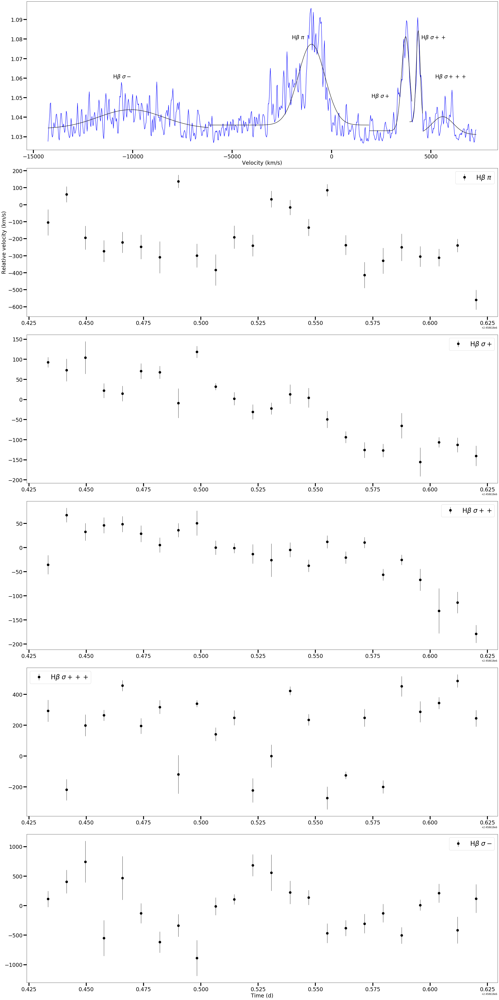

In [14]:
fig = plt.figure(tight_layout=True, figsize=(30,60))
BMXpoints = np.linspace(3625, 5460, 4200)
BMXpoints = BMXpoints[:4100]
xpointss = BMXpoints[1500:3800]
velocity = 299792.458*(xpointss[800:1600]-4861.363)/4861.363

gs = GridSpec(6, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])

ax1.plot(MayBVel, MayBmean, c='b')
popt,pcov = curve_fit(gaus,MayBVel[300:600],MayBmean[300:600],p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
ax1.plot(MayBVel[300:600],gaus(MayBVel[300:600],*popt),c='k')
BMPiMean = popt[1]
BMPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[600:680],MayBmean[600:680],p0=[1,wavelToVelB(4920),wavelToStdB(5),-1])
ax1.plot(MayBVel[600:680],gaus(MayBVel[600:680],*popt),c='k')

BMSPMean = popt[1]
BMSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[675:775],MayBmean[675:775],p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03])
ax1.plot(MayBVel[675:700],gaus(MayBVel[675:700],*popt),c='k')

BMSPPMean = popt[1]
BMSPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[700:],MayBmean[700:],p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
ax1.plot(MayBVel[700:],gaus(MayBVel[700:],*popt),c='k')

BMSPPPMean = popt[1]
BMSPPPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayBVel[:300],MayBmean[:300],p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03],bounds=([0,wavelToVelB(4640),wavelToStdB(20),-1.1],[0.1,wavelToVelB(4720),wavelToStdB(40),-0.95]))
ax1.plot(MayBVel[:300],gaus(MayBVel[:300],*popt),c='k')

BMSMMean = popt[1]
BMSMErr = np.sqrt(np.diag(pcov))[1]

BMGaussMEansM = []
BMGaussMEansMErr = []
BMGaussMEansMSP = []
BMGaussMEansMErrSP = []
BMGaussMEansMSPP = []
BMGaussMEansMErrSPP = []
BMGaussMEansMSPPP = []
BMGaussMEansMErrSPPP = []
BMGaussMEansMSM = []
BMGaussMEansMErrSM = []
miniCount = 0
timeBM = np.array(timeBM)
timeBMMean = np.nanmean(np.pad(timeBM.astype(float), (0, 5 - timeBM.size%5), mode='constant', constant_values=np.NaN).reshape(-1, 5), axis=1)    
timeBMMean  = timeBMMean[:-1]
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(80)
fluxstackSPP = np.zeros(100)
fluxstackSPPP = np.zeros(100)
fluxstackSM = np.zeros(300)
for i in range(120):
    thisflux = stackBM[i]
    piComp = thisflux[300:600]
    SPComp = thisflux[600:680]
    SPPComp = thisflux[675:775]
    SPPPComp = thisflux[700:]
    SMComp = thisflux[:300]
    if miniCount == 4:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 5
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1100:1400]),fluxstack,p0=[0.04,wavelToVelB(4840),wavelToStdB(12),-1.03])
        BMGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / 5
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1400:1480]),fluxstackSP,p0=[1,wavelToVelB(4920),wavelToStdB(5),1.03])
        BMGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErrSP.append(thisstd)
        
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPP = fluxstackSPP / 5
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1475:1575]),fluxstackSPP,p0=[0.05,wavelToVelB(4930),wavelToStdB(2),-1.03])
        BMGaussMEansMSPP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErrSPP.append(thisstd)
        
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSPPP = fluxstackSPPP / 5
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[1500:1600]),fluxstackSPPP,p0=[0.05,wavelToVelB(4960),wavelToStdB(5),-1.03], bounds=([0,wavelToVelB(4940),wavelToStdB(2),-1.1],[1.5,wavelToVelB(4960),wavelToStdB(10),-0.95]))
        BMGaussMEansMSPPP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErrSPPP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / 5
        popt,pcov = curve_fit(gaus,wavelToVelB(xpointss[800:1100]),fluxstackSM,p0=[0.05,wavelToVelB(4693),wavelToStdB(20),-1.03])
        BMGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        BMGaussMEansMErrSM.append(thisstd)
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(80)
        fluxstackSPP = np.zeros(100)
        fluxstackSPPP = np.zeros(100)
        fluxstackSM = np.zeros(300)
    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSPP = fluxstackSPP + SPPComp
        fluxstackSPPP = fluxstackSPPP + SPPPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1

ax2 = fig.add_subplot(gs[1, 0])
ax2.errorbar(timeBMMean,BMGaussMEansM-BMPiMean,yerr=BMGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '',ms=10 ,label=r"H$\beta$ $\pi$")
ax3 = fig.add_subplot(gs[2, 0])
ax3.errorbar(timeBMMean,BMGaussMEansMSP-BMSPMean,yerr=BMGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k',ms=10, ls = '' ,label = r"H$\beta$ $\sigma+$")
ax4 = fig.add_subplot(gs[3, 0])
ax4.errorbar(timeBMMean,BMGaussMEansMSPP-BMSPPMean,yerr=BMGaussMEansMErrSPP,c='k', lw=1, marker='o',ecolor='k',ms=10, ls = '',label=r"H$\beta$ $\sigma++$" )
ax5 = fig.add_subplot(gs[4, 0])
ax5.errorbar(timeBMMean,BMGaussMEansMSPPP-BMSPPPMean,yerr=BMGaussMEansMErrSPPP,c='k', lw=1, marker='o',ecolor='k',ms=10, ls = '',label=r"H$\beta$ $\sigma+++$")
ax6 = fig.add_subplot(gs[5, 0])
ax6.errorbar(timeBMMean,BMGaussMEansMSM-BMSMMean,yerr=BMGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '',ms=10 ,label=r"H$\beta$ $\sigma-$")





ax6.set_xlabel('Time (d)', fontsize=23)
ax1.set_xlabel('Velocity (km/s)', fontsize=23)
ax2.set_ylabel('Relative velocity (km/s)', fontsize=23)

ax1.tick_params(labelsize=23)
ax2.tick_params(labelsize=23)
ax3.tick_params(labelsize=23)
ax4.tick_params(labelsize=23)
ax5.tick_params(labelsize=23)
ax6.tick_params(labelsize=23)
ax2.legend(fontsize=28)
ax3.legend(fontsize=28)
ax4.legend(fontsize=28)
ax5.legend(fontsize=28)
ax6.legend(fontsize=28)
ax1.tick_params(which='major', length=14)
ax2.tick_params(which='major', length=14)
ax3.tick_params(which='major', length=14)
ax4.tick_params(which='major', length=14)
ax5.tick_params(which='major', length=14)
ax6.tick_params(which='major', length=14)
ax1.tick_params(which='both', width=4)
ax2.tick_params(which='both', width=4)
ax3.tick_params(which='both', width=4)
ax5.tick_params(which='both', width=4)
ax4.tick_params(which='both', width=4)
ax6.tick_params(which='both', width=4)
ax1.annotate(r"H$\beta$ $\sigma-$", xy=(-11000, 1.06),fontsize=23)
ax1.annotate(r"H$\beta$ $\pi$", xy=(-2000, 1.08),fontsize=23)
ax1.annotate(r"H$\beta$ $\sigma+$", xy=(2000, 1.05),fontsize=23)
ax1.annotate(r"H$\beta$ $\sigma++$", xy=(4500, 1.08),fontsize=23)
ax1.annotate(r"H$\beta$ $\sigma+++$", xy=(5200, 1.06),fontsize=23)
plt.savefig('HBeta2019GaussV.pdf')

In [59]:
#get velocities from std of un coadded

5591.880389253043 68.96047305703915


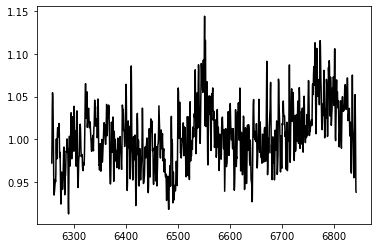

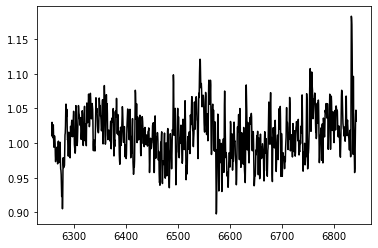

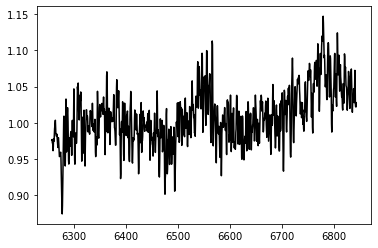

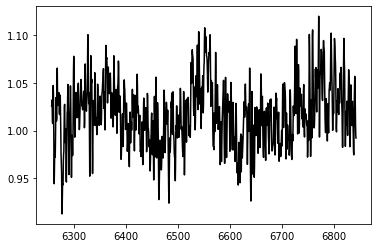

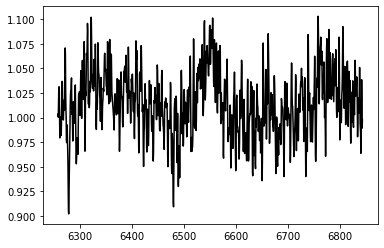

...

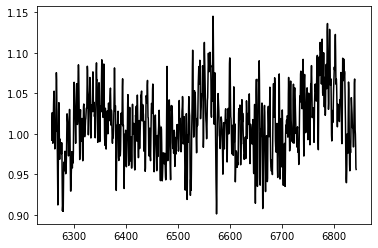

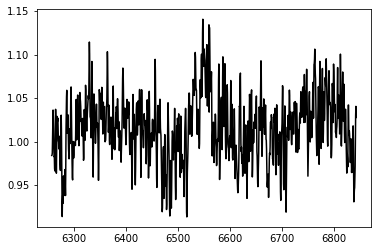

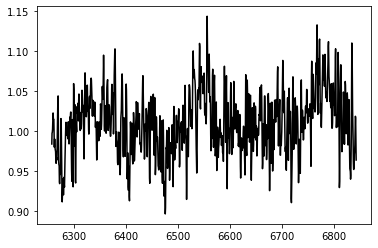

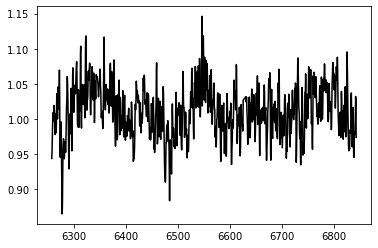

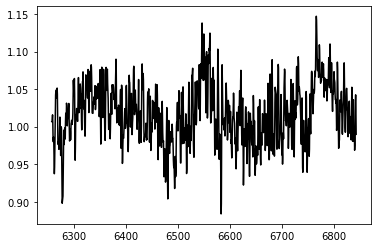

In [4]:
RJXpoints = np.linspace(5525, 7575, 4200)
RJXpoints = RJXpoints[:4100]
xpointss = RJXpoints[800:3350]

testMean = np.zeros(len(xpointss))

xp1 = xpointss[:720]
xp2 = xpointss[1050:1225]
xp3 = xpointss[1400:1650]
xp4 = xpointss[1900:1940]
xp5 = xpointss[2400:2550]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
for i in range(113):
    flux = holder_arrayRJ[i]
    if i ==11:
        flux[2725:2745] = np.median(flux[2700:2725])
    if i ==99:
        flux[1580:1600] = np.clip(flux[1580:1600],0,500)
    if i ==111:
        flux[2250:2300] = np.clip(flux[2250:2300], 0,270)
    if i == 43:
        flux[1900:2100] = np.clip(flux[1900:2100], 0,500)
    if i == 109:
        flux[1100:1200] = np.clip(flux[1100:1200],0,500)
    if i ==42:
        flux[2695:2735] = np.clip(flux[2695:2735],0, 400)
    if i == 18:
        flux[2000:3350] = np.clip(flux[2000:3350],0, 500)
    if i ==105:
        flux[2200:2220] = np.clip(flux[2200:2220], 0,350)
    flux = flux[:4100]
    flux = flux[800:3350]
    if i ==44:
        for c, el1 in enumerate(flux[1000:1150]):
            flux[1000+c] = ((1-c/150)*np.median(flux[950:1000])+(c/150)*np.median(flux[1150:1200]))
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = flux/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for count, el in enumerate(fluxNormed):
        if el > 1.15:
            fluxNormed[count] = uniform_filter(fluxNormed,size=200)[count]
        
    fluxNormed = fluxNormed * f2(xpointss, popt[0], popt[1], popt[2], popt[3],popt[4])
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = fluxNormed/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    testMean = testMean + fluxNormed
    plt.plot(xpointss[700:1900], fluxNormed[700:1900], c='k')
    #plt.plot(xpointss[1600:1900], testMean[1600:1900], c='r')
    plt.show()
    if i ==0:
        stack = fluxNormed[700:1900]
    else:
        stack = np.vstack((stack, fluxNormed[700:1900]))
testMean = testMean/113   
stackRJ = stack

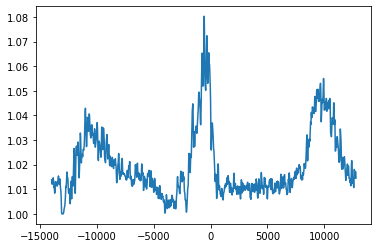

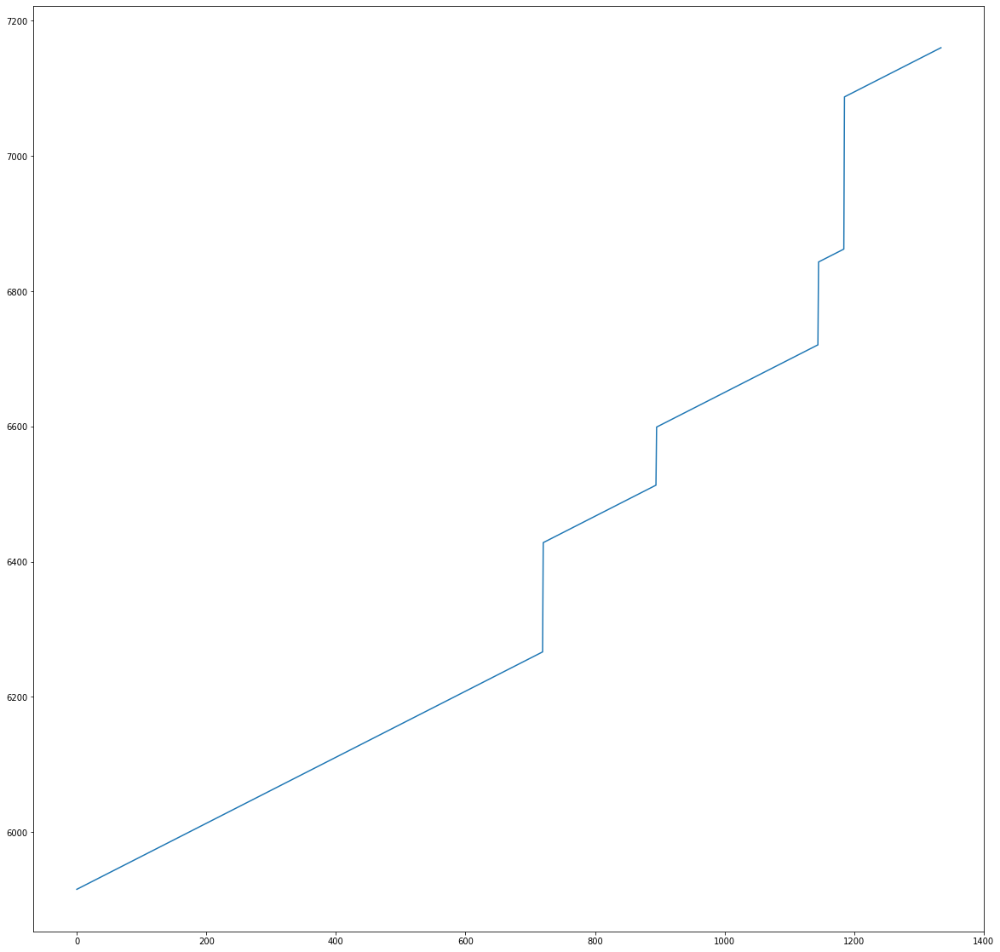

In [5]:
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801
velocityRJ = velocity
colmean = np.clip(stackRJ, 1.0,1.15).mean(axis=0)
plt.plot(velocity,colmean)
JulRVel = velocity
JulRmean = colmean

plt.show()
plt.figure(figsize=(20,20))
plt.plot(xpF)

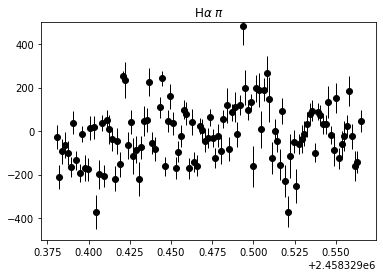

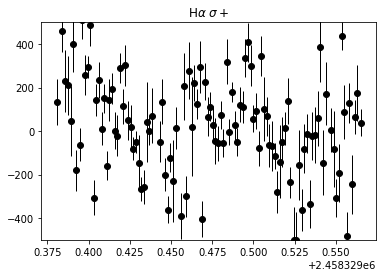

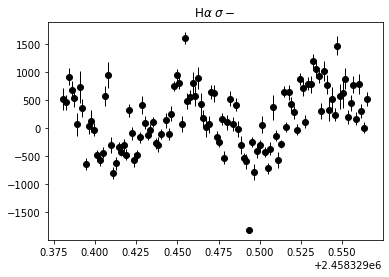

In [8]:
RJXpoints = np.linspace(5525, 7575, 4200)
RJXpoints = RJXpoints[:4100]
xpointss = RJXpoints[800:3350]
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801
popt,pcov = curve_fit(gaus,JulRVel[450:750],JulRmean[450:750],p0=[0.0,wavelToVelR(6550),wavelToStdR(14),-1.01])
RJPiMean = popt[1]
RJPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulRVel[800:],JulRmean[800:],p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1])
RJSPMean = popt[1]
RJSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulRVel[:350],JulRmean[:350],p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
RJSMMean = popt[1]
RJSMErr = np.sqrt(np.diag(pcov))[1]
RJGaussMEansM = []
RJGaussMEansMErr = []
RJGaussMEansMSP = []
RJGaussMEansMErrSP = []
RJGaussMEansMSM = []
RJGaussMEansMErrSM = []
miniCount = 0
timeRJ = np.array(timeRJ)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(400)
fluxstackSM = np.zeros(350)
for i in range(113):
    thisflux = stackRJ[i]
    thisflux = stackRJ[i]
    piComp = thisflux[450:750]
    SPComp = thisflux[800:]
    SMComp = thisflux[:350]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1150:1450]),fluxstack,p0=[0.05,wavelToVelR(6550),wavelToStdR(14),-1.01])
        RJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErr.append(thisstd)
        piDiv = popt[0]
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / (1+piDiv)
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1500:1900]),fluxstackSP,p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1.0])
        RJGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErrSP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / (1+piDiv)
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[700:1050]),fluxstackSM,p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-0.9]))
        RJGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErrSM.append(thisstd)
        fluxstackSMOld = fluxstackSM
        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(len(SPComp))
        fluxstackSM = np.zeros(len(SMComp))

    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1
plt.title(r"H$\alpha$ $\pi$")
plt.errorbar(timeRJ,RJGaussMEansM-RJPiMean,yerr=RJGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.ylim(-500,500)
plt.show()
plt.title(r"H$\alpha$ $\sigma+$")
plt.errorbar(timeRJ,RJGaussMEansMSP-RJSPMean,yerr=RJGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k', ls = '' )
plt.ylim(-500,500)
plt.show()
plt.title(r"H$\alpha$ $\sigma-$" )
plt.errorbar(timeRJ,RJGaussMEansMSM-RJSMMean,yerr=RJGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
#plt.ylim(-500,500)

plt.show()

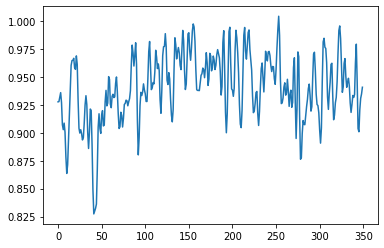

In [32]:
plt.plot(fluxstackSMOld)

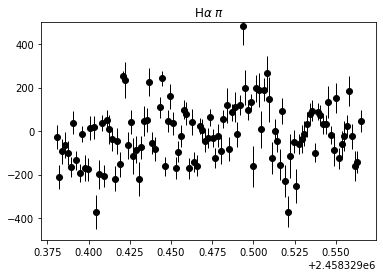

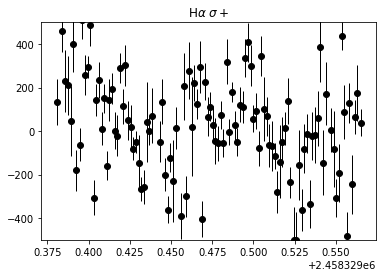

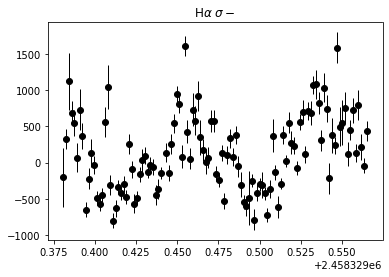

In [9]:
RJXpoints = np.linspace(5525, 7575, 4200)
RJXpoints = RJXpoints[:4100]
xpointss = RJXpoints[800:3350]
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801
popt,pcov = curve_fit(gaus,JulRVel[450:750],JulRmean[450:750],p0=[0.0,wavelToVelR(6550),wavelToStdR(14),-1.01])
RJPiMean = popt[1]
RJPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulRVel[800:],JulRmean[800:],p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1])
RJSPMean = popt[1]
RJSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulRVel[:350],JulRmean[:350],p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
RJSMMean = popt[1]
RJSMErr = np.sqrt(np.diag(pcov))[1]
RJGaussMEansM = []
RJGaussMEansMErr = []
RJGaussMEansMSP = []
RJGaussMEansMErrSP = []
RJGaussMEansMSM = []
RJGaussMEansMErrSM = []
miniCount = 0
timeRJ = np.array(timeRJ)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(400)
fluxstackSM = np.zeros(350)
for i in range(113):
    thisflux = stackRJ[i]
    thisflux = stackRJ[i]
    piComp = thisflux[450:750]
    SPComp = thisflux[800:]
    SMComp = thisflux[:350]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1150:1450]),fluxstack,p0=[0.05,wavelToVelR(6550),wavelToStdR(14),-1.01])
        RJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / 1
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1500:1900]),fluxstackSP,p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1.0])
        RJGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErrSP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / 1
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[700:1050]),fluxstackSM,p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
        RJGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErrSM.append(thisstd)

        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(len(SPComp))
        fluxstackSM = np.zeros(len(SMComp))

    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1
plt.title(r"H$\alpha$ $\pi$")
plt.errorbar(timeRJ,RJGaussMEansM-RJPiMean,yerr=RJGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.ylim(-500,500)
plt.show()
plt.title(r"H$\alpha$ $\sigma+$")
plt.errorbar(timeRJ,RJGaussMEansMSP-RJSPMean,yerr=RJGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k', ls = '' )
plt.ylim(-500,500)
plt.show()
plt.title(r"H$\alpha$ $\sigma-$" )
plt.errorbar(timeRJ,RJGaussMEansMSM-RJSMMean,yerr=RJGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
#plt.ylim(-500,500)

plt.show()

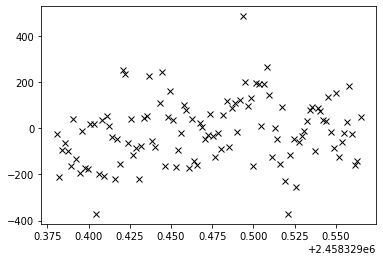

In [9]:
plt.plot(timeRJ,RJPiV,'kx')

In [10]:


RJPiV = RJGaussMEansM-RJPiMean
RJPiVe = RJGaussMEansMErr
np.save('RJPiV.npy', RJPiV)
np.save('RJPiVe.npy', RJPiVe)


RJSPV = RJGaussMEansMSP-RJSPMean
RJSPVe = RJGaussMEansMErrSP
np.save('RJSPV.npy', RJSPV)
np.save('RJSPVe.npy', RJSPVe)




RJSMV = RJGaussMEansMSM#-RJSMMean
RJSMVe = RJGaussMEansMErrSM
np.save('RJSMV.npy', RJSMV)
np.save('RJSMVe.npy', RJSMVe)



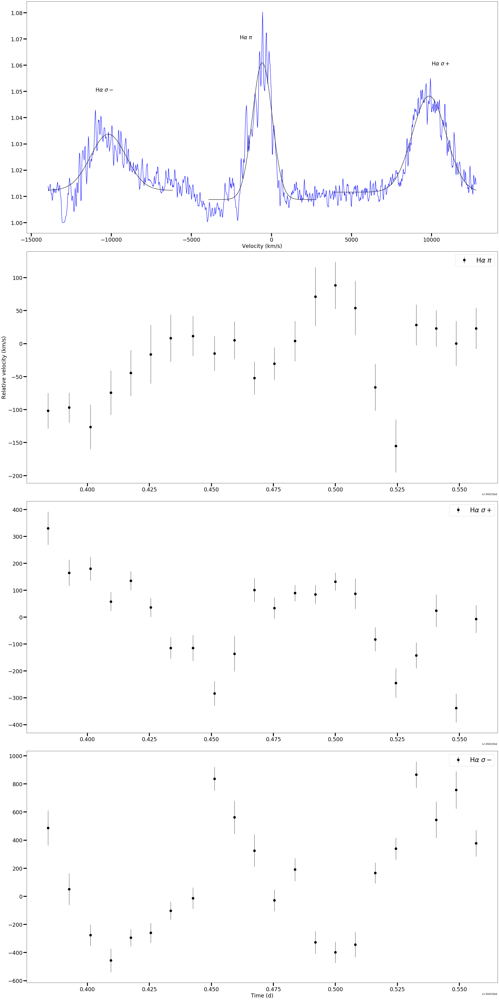

In [36]:
fig = plt.figure(tight_layout=True, figsize=(30,60))

RJXpoints = np.linspace(5525, 7575, 4200)
RJXpoints = RJXpoints[:4100]
xpointss = RJXpoints[800:3350]
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801

gs = GridSpec(4, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])

ax1.plot(JulRVel, JulRmean, c='b')
popt,pcov = curve_fit(gaus,JulRVel[450:750],JulRmean[450:750],p0=[0.0,wavelToVelR(6550),wavelToStdR(14),-1.01])
ax1.plot(JulRVel[450:750],gaus(JulRVel[450:750],*popt),c='k')
RJPiMean = popt[1]
RJPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,JulRVel[800:],JulRmean[800:],p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1])
ax1.plot(JulRVel[800:],gaus(JulRVel[800:],*popt),c='k')
RJSPMean = popt[1]
RJSPErr = np.sqrt(np.diag(pcov))[1]

popt,pcov = curve_fit(gaus,JulRVel[:350],JulRmean[:350],p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
ax1.plot(JulRVel[:350],gaus(JulRVel[:350],*popt),c='k')
RJSMMean = popt[1]
RJSMErr = np.sqrt(np.diag(pcov))[1]

RJGaussMEansM = []
RJGaussMEansMErr = []
RJGaussMEansMSP = []
RJGaussMEansMErrSP = []
RJGaussMEansMSM = []
RJGaussMEansMErrSM = []
miniCount = 0
timeRJ = np.array(timeRJ)
timeRJMean = np.nanmean(np.pad(timeRJ.astype(float), (0, 5 - timeRJ.size%5), mode='constant', constant_values=np.NaN).reshape(-1, 5), axis=1)    
timeRJMean  = timeRJMean[:-1]
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(400)
fluxstackSM = np.zeros(350)
for i in range(113):
    thisflux = stackRJ[i]
    thisflux = stackRJ[i]
    piComp = thisflux[450:750]
    SPComp = thisflux[800:]
    SMComp = thisflux[:350]
    if miniCount == 4:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 5
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1150:1450]),fluxstack,p0=[0.05,wavelToVelR(6550),wavelToStdR(14),-1.01])
        RJGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / 5
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1500:1900]),fluxstackSP,p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1.0])
        RJGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErrSP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / 5
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[700:1050]),fluxstackSM,p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
        RJGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RJGaussMEansMErrSM.append(thisstd)

        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(len(SPComp))
        fluxstackSM = np.zeros(len(SMComp))

    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[2, 0])
ax4 = fig.add_subplot(gs[3, 0])
ax2.errorbar(timeRJMean,RJGaussMEansM-RJPiMean,yerr=RJGaussMEansMErr,c='k', lw=1, marker='o',ms=10,ecolor='k', ls = '' ,label=r"H$\alpha$ $\pi$")
ax3.errorbar(timeRJMean,RJGaussMEansMSP-RJSPMean,yerr=RJGaussMEansMErrSP,c='k', lw=1, marker='o',ms=10,ecolor='k', ls = '' ,label=r"H$\alpha$ $\sigma+$")
ax4.errorbar(timeRJMean,RJGaussMEansMSM-RJSMMean,yerr=RJGaussMEansMErrSM,c='k', lw=1, marker='o',ms=10,ecolor='k', ls = '',label=r"H$\alpha$ $\sigma-$" )
        
        
ax4.set_xlabel('Time (d)', fontsize=23)
ax1.set_xlabel('Velocity (km/s)', fontsize=23)
ax2.set_ylabel('Relative velocity (km/s)', fontsize=23)

ax1.tick_params(labelsize=23)
ax2.tick_params(labelsize=23)
ax3.tick_params(labelsize=23)
ax4.tick_params(labelsize=23)
ax2.legend(fontsize=28)
ax3.legend(fontsize=28)
ax4.legend(fontsize=28)
ax1.tick_params(which='major', length=14)
ax2.tick_params(which='major', length=14)
ax3.tick_params(which='major', length=14)
ax4.tick_params(which='major', length=14)

ax1.tick_params(which='both', width=4)
ax2.tick_params(which='both', width=4)
ax3.tick_params(which='both', width=4)

ax4.tick_params(which='both', width=4)
ax1.annotate(r"H$\alpha$ $\sigma-$", xy=(-11000, 1.05),fontsize=23)
ax1.annotate(r"H$\alpha$ $\pi$", xy=(-2000, 1.07),fontsize=23)
ax1.annotate(r"H$\alpha$ $\sigma+$", xy=(10000, 1.06),fontsize=23)


plt.savefig('HAlpha2018GaussV.pdf')



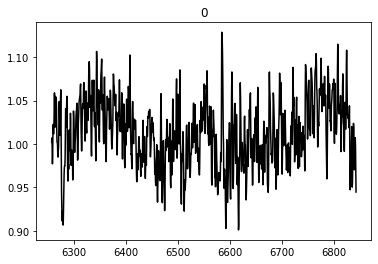

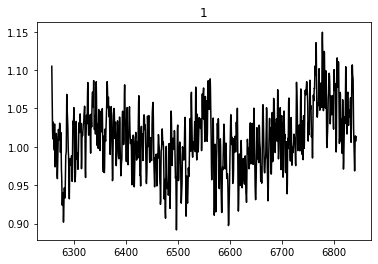

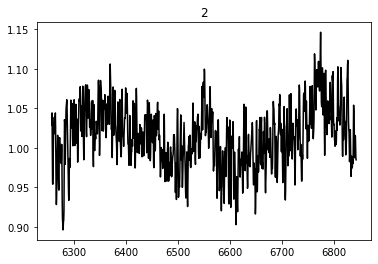

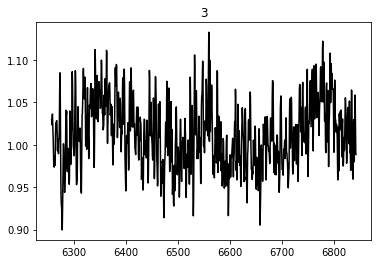

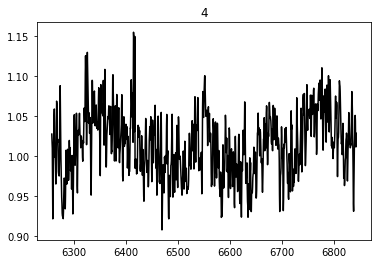

...

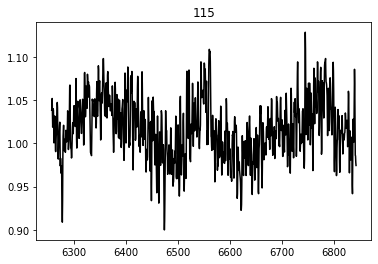

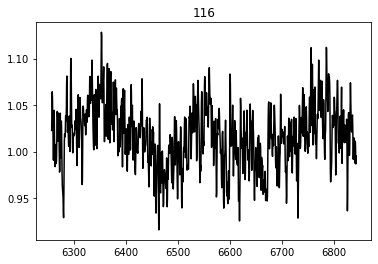

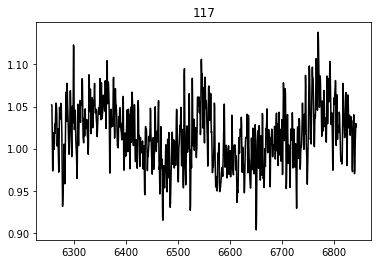

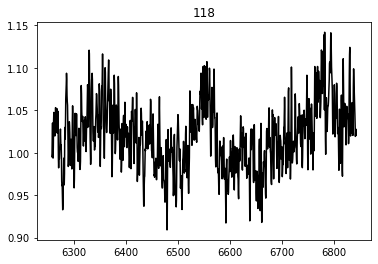

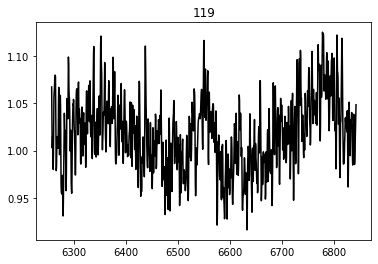

In [11]:
RMXpoints = np.linspace(5525, 7575, 4200)
RMXpoints = RMXpoints[:4100]
xpointss = RMXpoints[800:3350]


testMean = np.zeros(len(xpointss))
xp1 = xpointss[:720]
xp2 = xpointss[1050:1225]
xp3 = xpointss[1400:1650]
xp4 = xpointss[1900:1940]
xp5 = xpointss[2400:2550]
xpF = np.append(xp1,xp2)
xpF = np.append(xpF, xp3)
xpF = np.append(xpF, xp4)
xpF = np.append(xpF, xp5)
for i in range(120):
    flux = holder_arrayRM[i]
    if i ==12:
        flux[2395:2410] = np.clip(flux[2395:2410], 0,350)
    if i ==40:
        flux[990:1010]= np.clip(flux[990:1010], 0, 460)
        flux[3645:3670] = np.clip(flux[3645:3670], 0,200)
    if i ==45:
        flux[2310:2335]= np.clip(flux[2310:2335],0,300)
    if i ==65:
        flux[1420:1455] = np.clip(flux[1420:1455], 0,500)
    if i ==69:
        flux[1950:1970] = np.clip(flux[1950:1970],0,400)
    if i == 83:
        flux[1855:1870] = np.clip(flux[1855:1870],0,400)
        flux[2120:2130] = np.clip(flux[2120:2130],0,400)
    flux = flux[:4100]
    flux = flux[800:3350]

    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = flux/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    for count, el in enumerate(fluxNormed):
        if el > 1.15:
            fluxNormed[count] = uniform_filter(fluxNormed,size=200)[count]
        
    fluxNormed = fluxNormed * f2(xpointss, popt[0], popt[1], popt[2], popt[3],popt[4])
    tmp1 = flux[:720]
    tmp2 = flux[1050:1225]
    tmp3 = flux[1400:1650]
    tmp4 = flux[1900:1940]
    tmp5 = flux[2400:2550]
    emptiedflux = np.append(tmp1,tmp2)
    emptiedflux = np.append(emptiedflux, tmp3)
    emptiedflux = np.append(emptiedflux, tmp4)
    emptiedflux = np.append(emptiedflux, tmp5)
    popt, pcov = curve_fit(f2, xpF, uniform_filter(emptiedflux,size=20))
    fluxNormed = fluxNormed/f2(xpointss, popt[0], popt[1], popt[2], popt[3], popt[4])
    testMean = testMean + fluxNormed
    #plt.plot(xpointss[700:1900], testMean[700:1900])
    plt.title(str(i))
    plt.plot(xpointss[700:1900], fluxNormed[700:1900], c='k')
    #plt.plot(xpointss[1600:1900], testMean[1600:1900], c='r')
    plt.show()
    if i ==0:
        stack = fluxNormed[700:1900]
    else:
        stack = np.vstack((stack, fluxNormed[700:1900]))
testMean = testMean /120  
stackRM = stack

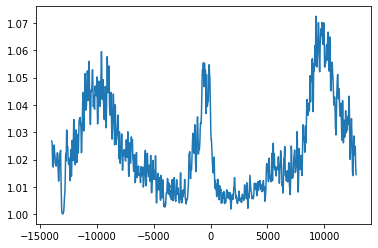

In [12]:
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801
velocityRJ = velocity
colmean = np.clip(stackRM, 1.0,1.15).mean(axis=0)
plt.plot(velocity,colmean)
MayRVel = velocity
MayRmean = colmean

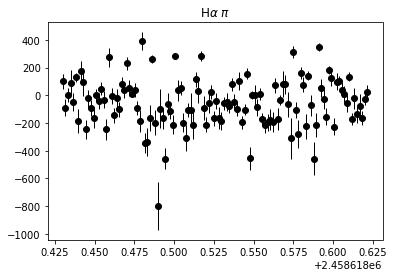

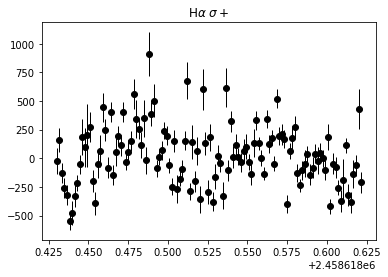

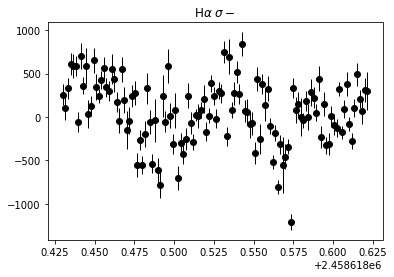

In [13]:
RMXpoints = np.linspace(5525, 7575, 4200)
RMXpoints = RMXpoints[:4100]
xpointss = RMXpoints[800:3350]
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801

popt,pcov = curve_fit(gaus,MayRVel[450:750],MayRmean[450:750],p0=[0.0,wavelToVelR(6550),wavelToStdR(14),-1.01])
RMPiMean = popt[1]
RMPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayRVel[800:],MayRmean[800:],p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1])
RMSPMean = popt[1]
RMSPErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayRVel[:350],MayRmean[:350],p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
RMSMMean = popt[1]
RMSMErr = np.sqrt(np.diag(pcov))[1]
RMGaussMEansM = []
RMGaussMEansMErr = []
RMGaussMEansMSP = []
RMGaussMEansMErrSP = []
RMGaussMEansMSM = []
RMGaussMEansMErrSM = []
miniCount = 0
timeRM = np.array(timeRM)
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(400)
fluxstackSM = np.zeros(350)
for i in range(120):
    thisflux = stackRM[i]
    thisflux = stackRM[i]
    piComp = thisflux[450:750]
    SPComp = thisflux[800:]
    SMComp = thisflux[:350]
    if miniCount == 0:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 1
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1150:1450]),fluxstack,p0=[0.05,wavelToVelR(6550),wavelToStdR(14),-1.01])
        RMGaussMEansM.append(popt[1])
        RMINorm = popt[0]
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / (1+RMINorm) # delet this
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1500:1900]),fluxstackSP,p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1.0])
        RMGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErrSP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / (1+RMINorm) #and this
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[700:1050]),fluxstackSM,p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-0.9]))
        RMGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErrSM.append(thisstd)

        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(len(SPComp))
        fluxstackSM = np.zeros(len(SMComp))

    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1

plt.errorbar(timeRM,RMGaussMEansM-RMPiMean,yerr=RMGaussMEansMErr,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\alpha$ $\pi$")
plt.show()
plt.errorbar(timeRM,RMGaussMEansMSP-RMSPMean,yerr=RMGaussMEansMErrSP,c='k', lw=1, marker='o',ecolor='k', ls = '' )
plt.title(r"H$\alpha$ $\sigma+$")
plt.show()
plt.errorbar(timeRM,RMGaussMEansMSM-RMSMMean,yerr=RMGaussMEansMErrSM,c='k', lw=1, marker='o',ecolor='k', ls = '')
plt.title(r"H$\alpha$ $\sigma-$" )
plt.show()



In [6]:
b = [1,2,3]
b = np.array(b)
print(b[b <3])

[1 2]


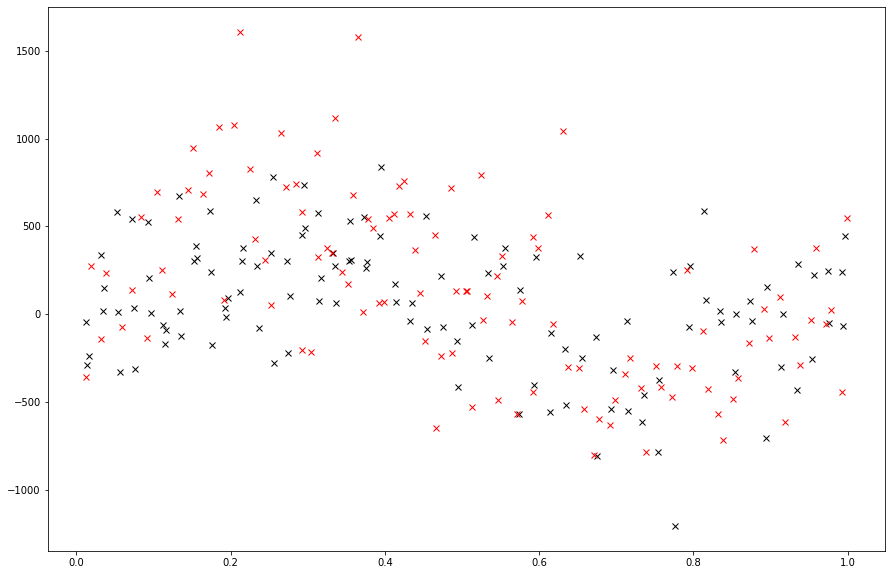

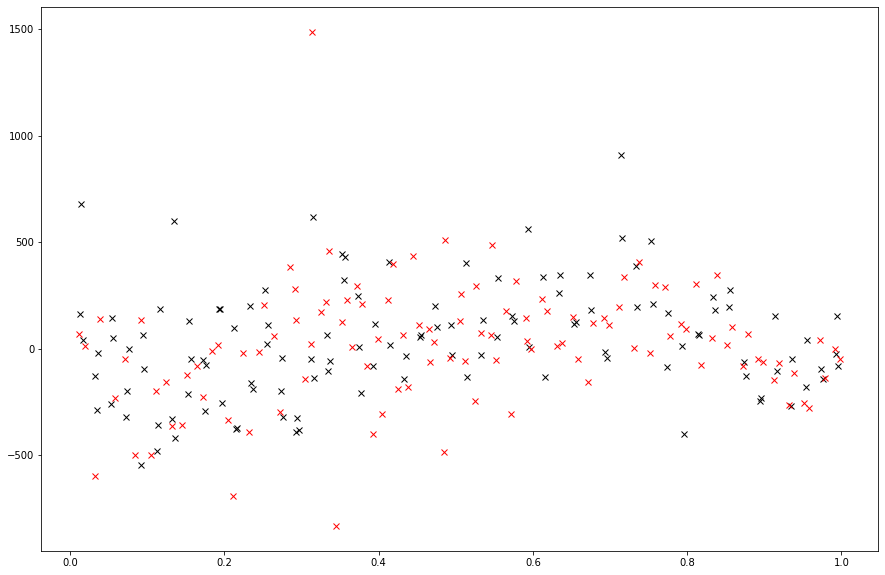

In [19]:
plt.figure(figsize=(15,10))
MayPhases = foldMeth(timeRM, 0.08029820145279275)
sortIndi = np.argsort(MayPhases)
MayPhases = MayPhases[sortIndi]
RMFluxes = RMGaussMEansMSM-RMSMMean
RMFluxes = RMFluxes[sortIndi]
plt.plot(MayPhases,RMFluxes,'kx')

JulPhases = foldMeth(timeRJ, 0.08029820145279275)
sortIndi = np.argsort(JulPhases)
JulPhases = JulPhases[sortIndi]
RJFluxes = RJGaussMEansMSM-RJSMMean
RJFluxes = RJFluxes[sortIndi]
plt.plot(JulPhases,RJFluxes,'rx')





plt.figure(figsize=(15,10))
MayPhases = foldMeth(timeRM, 0.08029820145279275)
sortIndi = np.argsort(MayPhases)
MayPhases = MayPhases[sortIndi]
RMFluxes = RMGaussMEansMSP-RMSPMean
RMFluxes = RMFluxes[sortIndi]
plt.plot(MayPhases,RMFluxes,'kx')

JulPhases = foldMeth(timeRJ, 0.08029820145279275)
sortIndi = np.argsort(JulPhases)
JulPhases = JulPhases[sortIndi]
RJFluxes = RJGaussMEansMSP-RJSPMean
RJFluxes = RJFluxes[sortIndi]
plt.plot(JulPhases,RJFluxes,'rx')

In [14]:


RMPiV = RMGaussMEansM-RMPiMean
RMPiVe = RMGaussMEansMErr
np.save('RMPiV.npy', RMPiV)
np.save('RMPiVe.npy', RMPiVe)


RMSPV = RMGaussMEansMSP-RMSPMean
RMSPVe = RMGaussMEansMErrSP
np.save('RMSPV.npy', RMSPV)
np.save('RMSPVe.npy', RMSPVe)




RMSMV = RMGaussMEansMSM#-RMSMMean
RMSMVe = RMGaussMEansMErrSM
np.save('RMSMV.npy', RMSMV)
np.save('RMSMVe.npy', RMSMVe)



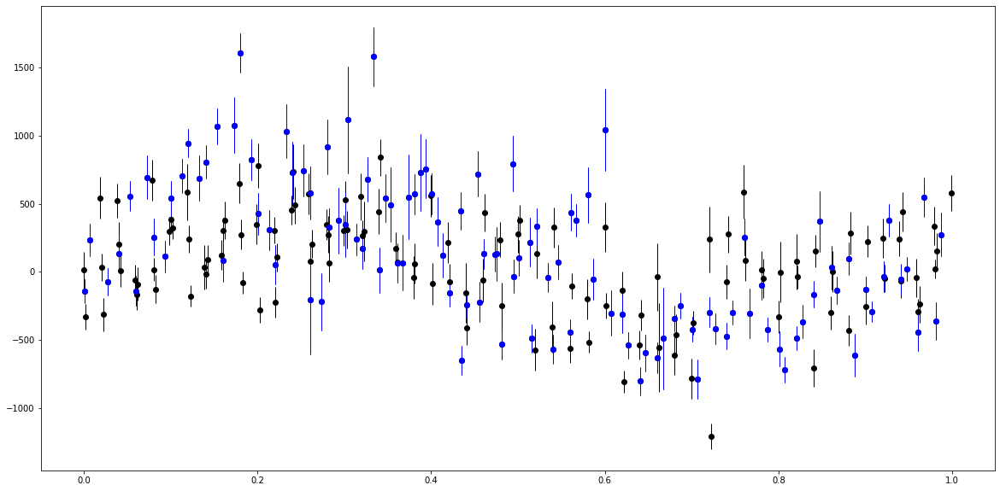

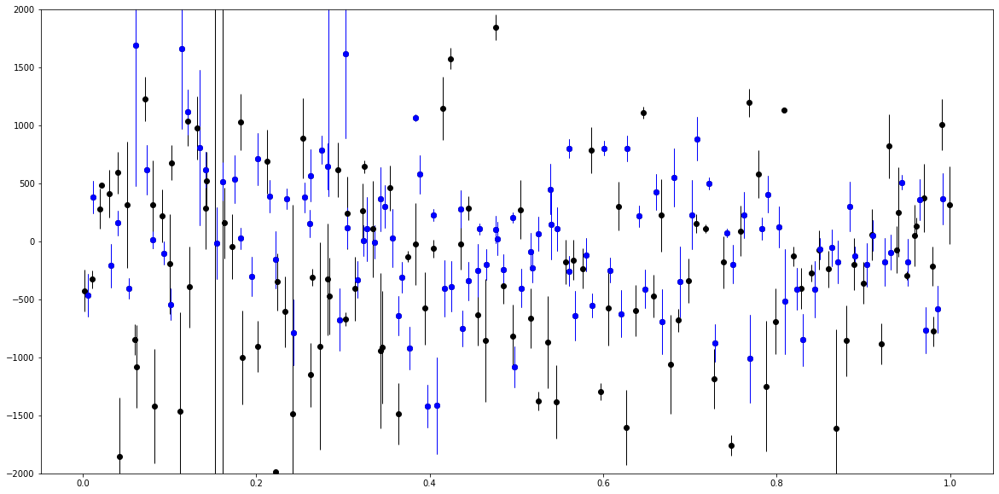

In [53]:
timestofold = np.append(timeRJ,timeRM)
velocitiesRSM = np.append(RJGaussMEansMSM-RJSMMean, RMGaussMEansMSM-RMSMMean)
errorsRSM = np.append(RJGaussMEansMErrSM,RMGaussMEansMErrSM)
phasesRSM = foldMeth(timestofold,0.08029870250017346)
sortIndi = np.argsort(phasesRSM)
phasesRSM = phasesRSM[sortIndi]
velocitiesRSM = velocitiesRSM[sortIndi]
errorsRSM = errorsRSM[sortIndi]
plt.figure(figsize=(20,10))
plt.errorbar(phasesRSM, velocitiesRSM, yerr=errorsRSM,c='k', lw=1, marker='o',ecolor='k', ls = '')

timestofold = timeRJ
velocitiesRSM = RJGaussMEansMSM-RJSMMean
errorsRSM = RJGaussMEansMErrSM
phasesRSM = foldMeth(timestofold,0.08029870250017346)
plt.errorbar(phasesRSM, velocitiesRSM, yerr=errorsRSM,c='b', lw=1, marker='o',ecolor='b', ls = '')
plt.savefig('RSMPhase.jpg')
plt.show()



timestofold = np.append(timeBJ,timeBM)
velocitiesBSM = np.append(BJGaussMEansMSM-BJSMMean, BMGaussMEansMSM-BMSMMean)
errorsBSM = np.append(BJGaussMEansMErrSM,BMGaussMEansMErrSM)
phasesBSM = foldMeth(timestofold,0.08029870250017346)
sortIndi = np.argsort(phasesBSM)
phasesBSM = phasesBSM[sortIndi]
velocitiesBSM = velocitiesBSM[sortIndi]
errorsBSM = errorsBSM[sortIndi]
plt.figure(figsize=(20,10))
plt.errorbar(phasesBSM, velocitiesBSM, yerr=errorsBSM,c='k', lw=1, marker='o',ecolor='k', ls = '')

timestofold = timeBJ
velocitiesBSM = BJGaussMEansMSM-BJSMMean
errorsBSM = BJGaussMEansMErrSM
phasesBSM = foldMeth(timestofold,0.08029870250017346)
plt.errorbar(phasesBSM, velocitiesBSM, yerr=errorsBSM,c='b', lw=1, marker='o',ecolor='b', ls = '')
plt.ylim(-2000,2000)
plt.savefig('BSMPhase.jpg')

plt.show()

#timeBM,BMGaussMEansMSM-BMSMMean,yerr=BMGaussMEansMErrSM


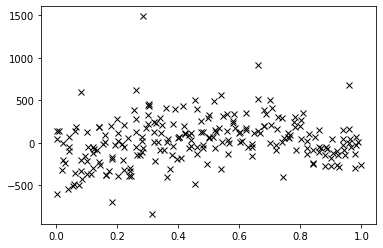

In [56]:
RPis = np.append(RJGaussMEansMSP-RJSPMean,RMGaussMEansMSP-RMSPMean)
timess = np.append(timeRJ,timeRM)
phasesRSM = foldMeth(timess,0.08029870250017346)
plt.plot(phasesRSM,RPis, 'kx')


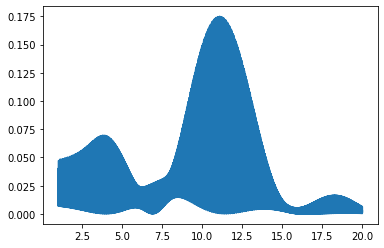

In [28]:
freq = np.linspace(1,20,10000)
velocitiesRSP = np.append(RJGaussMEansMSP-RJSPMean,RMGaussMEansMSP-RMSPMean)
powerPl = LombScargle(timestofold,velocitiesRSP).power(freq)
plt.plot(freq,powerPl)

D:\conda\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning: Mean of empty slice


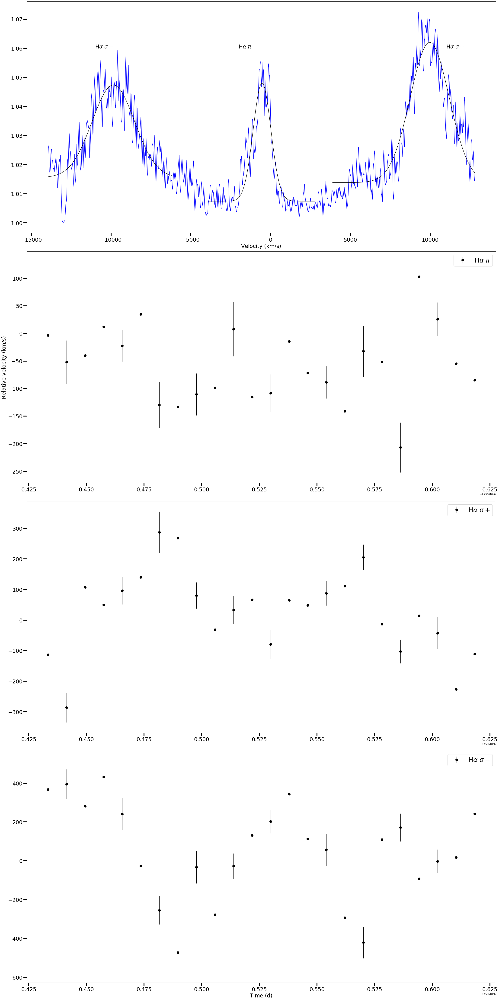

In [73]:
fig = plt.figure(tight_layout=True, figsize=(30,60))

RMXpoints = np.linspace(5525, 7575, 4200)
RMXpoints = RMXpoints[:4100]
xpointss = RMXpoints[800:3350]
velocity = 299792.458*(xpointss[700:1900]-6562.801)/6562.801

gs = GridSpec(4, 1, figure=fig)
ax1 = fig.add_subplot(gs[0, 0])

ax1.plot(MayRVel, MayRmean, c='b')
popt,pcov = curve_fit(gaus,MayRVel[450:750],MayRmean[450:750],p0=[0.0,wavelToVelR(6550),wavelToStdR(14),-1.01])
ax1.plot(MayRVel[450:750],gaus(MayRVel[450:750],*popt),c='k')
RMPiMean = popt[1]
RMPiErr = np.sqrt(np.diag(pcov))[1]
popt,pcov = curve_fit(gaus,MayRVel[800:],MayRmean[800:],p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1])
ax1.plot(MayRVel[800:],gaus(MayRVel[800:],*popt),c='k')
RMSPMean = popt[1]
RMSPErr = np.sqrt(np.diag(pcov))[1]

popt,pcov = curve_fit(gaus,MayRVel[:350],MayRmean[:350],p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
ax1.plot(MayRVel[:350],gaus(MayRVel[:350],*popt),c='k')
RMSMMean = popt[1]
RMSMErr = np.sqrt(np.diag(pcov))[1]

RMGaussMEansM = []
RMGaussMEansMErr = []
RMGaussMEansMSP = []
RMGaussMEansMErrSP = []
RMGaussMEansMSM = []
RMGaussMEansMErrSM = []
miniCount = 0
timeRM = np.array(timeRM)
timeRMMean = np.nanmean(np.pad(timeRM.astype(float), (0, 5 - timeRM.size%5), mode='constant', constant_values=np.NaN).reshape(-1, 5), axis=1)    
timeRMMean  = timeRMMean[:-1]
fluxstack = np.zeros(300)
fluxstackSP = np.zeros(400)
fluxstackSM = np.zeros(350)
for i in range(120):
    thisflux = stackRM[i]
    thisflux = stackRM[i]
    piComp = thisflux[450:750]
    SPComp = thisflux[800:]
    SMComp = thisflux[:350]
    if miniCount == 4:
        fluxstack = fluxstack + piComp
        fluxstack = fluxstack / 5
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1150:1450]),fluxstack,p0=[0.05,wavelToVelR(6550),wavelToStdR(14),-1.01])
        RMGaussMEansM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErr.append(thisstd)
        
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSP = fluxstackSP / 5
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[1500:1900]),fluxstackSP,p0=[0.04,wavelToVelR(6780),wavelToStdR(25),-1.0])
        RMGaussMEansMSP.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErrSP.append(thisstd)
        
        fluxstackSM = fluxstackSM + SMComp
        fluxstackSM = fluxstackSM / 5
        popt,pcov = curve_fit(gaus,wavelToVelR(xpointss[700:1050]),fluxstackSM,p0=[0.02,wavelToVelR(6340),wavelToStdR(25),-1.0],bounds=([0,wavelToVelR(6300),wavelToStdR(15),-1.1],[0.1,wavelToVelR(6375),wavelToStdR(40),-1.0]))
        RMGaussMEansMSM.append(popt[1])
        thisstd = np.sqrt(np.diag(pcov))[1]
        RMGaussMEansMErrSM.append(thisstd)

        miniCount = 0
        fluxstack = np.zeros(len(piComp))
        fluxstackSP = np.zeros(len(SPComp))
        fluxstackSM = np.zeros(len(SMComp))

    else:
        fluxstack = fluxstack + piComp
        fluxstackSP = fluxstackSP + SPComp
        fluxstackSM = fluxstackSM + SMComp
        miniCount +=1
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[2, 0])
ax4 = fig.add_subplot(gs[3, 0])
ax2.errorbar(timeRMMean,RMGaussMEansM-RMPiMean,yerr=RMGaussMEansMErr,c='k', lw=1, marker='o',ms=10,ecolor='k', ls = '' ,label=r"H$\alpha$ $\pi$")
ax3.errorbar(timeRMMean,RMGaussMEansMSP-RMSPMean,yerr=RMGaussMEansMErrSP,c='k', lw=1, marker='o',ms=10,ecolor='k', ls = '' ,label=r"H$\alpha$ $\sigma+$")
ax4.errorbar(timeRMMean,RMGaussMEansMSM-RMSMMean,yerr=RMGaussMEansMErrSM,c='k', lw=1, marker='o',ms=10,ecolor='k', ls = '',label=r"H$\alpha$ $\sigma-$" )
        
        
ax4.set_xlabel('Time (d)', fontsize=23)
ax1.set_xlabel('Velocity (km/s)', fontsize=23)
ax2.set_ylabel('Relative velocity (km/s)', fontsize=23)

ax1.tick_params(labelsize=23)
ax2.tick_params(labelsize=23)
ax3.tick_params(labelsize=23)
ax4.tick_params(labelsize=23)
ax2.legend(fontsize=28)
ax3.legend(fontsize=28)
ax4.legend(fontsize=28)
ax1.tick_params(which='major', length=14)
ax2.tick_params(which='major', length=14)
ax3.tick_params(which='major', length=14)
ax4.tick_params(which='major', length=14)

ax1.tick_params(which='both', width=4)
ax2.tick_params(which='both', width=4)
ax3.tick_params(which='both', width=4)

ax4.tick_params(which='both', width=4)
ax1.annotate(r"H$\alpha$ $\sigma-$", xy=(-11000, 1.06),fontsize=23)
ax1.annotate(r"H$\alpha$ $\pi$", xy=(-2000, 1.06),fontsize=23)
ax1.annotate(r"H$\alpha$ $\sigma+$", xy=(11000, 1.06),fontsize=23)


plt.savefig('HAlpha2019GaussV.pdf')



In [87]:


print('BJPi = ',BJPiMean,' +/- ',wavelToStdB(3.1608130721059107))
print('BMPi = ',BMPiMean,' +/- ',wavelToStdB(5.503823382818695))
print('BJSP = ',BJSPMean,' +/- ',wavelToStdB(1.7258034265838111))
print('BMSP = ',BMSPMean,' +/- ',wavelToStdB(2.1146394144092935))
print('BJSPP = ',BJSPPMean,' +/- ',wavelToStdB(0.9388569879266314))
print('BMSPP = ',BMSPPMean,' +/- ',wavelToStdB(1.7785422270971072))
print('BJSPPP = ',BJSPPPMean,' +/- ',wavelToStdB(4.9033596262554635))
print('BMSPPP = ',BMSPPPMean,' +/- ',wavelToStdB(5.009535385307269))
print('BJSM = ',BJSMMean,' +/- ',wavelToStdB(7.9747225847525085))





print('BMSM = ',BMSMMean,' +/- ',wavelToStdB(13.175726319616976))
      

      
print('RJPi = ',RJPiMean,' +/- ',wavelToStdB(3.020340227463366))
print('RMPi = ',RMPiMean,' +/- ',wavelToStdB(3.8626838413585856))
print('RJSP = ',RJSPMean,' +/- ',wavelToStdB(5.439118511379208))
print('RMSP = ',RMSPMean,' +/- ',wavelToStdB(5.722204384572904))
print('RJSM = ',RJSMMean,' +/- ',wavelToStdB(11.28667783265217))
print('RMSM = ',RMSMMean,' +/- ',wavelToStdB(8.091272189888555))

BJPi =  -1320.06739662036  +/-  195.29051017588006
BMPi =  -1006.017510324598  +/-  340.05316095218484
BJSP =  3496.643630434767  +/-  106.62858699716911
BMSP =  3726.820716968231  +/-  130.6527784646474
BJSPP =  4173.8406659761895  +/-  58.00718232040972
BMSPP =  4360.2757084107625  +/-  109.88704835611418
BJSPPP =  5394.857592270585  +/-  302.95356958557784
BMSPPP =  5591.880389253043  +/-  309.51362792516306
BJSM =  -10363.413728748637  +/-  492.71741370324423
BMSM =  -10093.359426663455  +/-  814.0608938893783
RJPi =  -570.5904341797951  +/-  186.6114099348075
RMPi =  -533.876481856532  +/-  238.6555233791346
RJSP =  9851.530908864002  +/-  336.05537713326913
RMSP =  9975.3661768982  +/-  353.5458086578224
RJSM =  -10186.749471229927  +/-  697.3462276467017
RMSM =  -9855.122521367819  +/-  499.9184190548993
